In [82]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pickle
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
%matplotlib inline

## EDA and Data Prep

In [83]:
xls = pd.ExcelFile('Final Data with Actual.xlsx')
df_cs = pd.read_excel(xls, 'CS')
df_ts = pd.read_excel(xls, 'TS')
df_fs = pd.read_excel(xls, 'FS')

In [84]:
print(df_cs.columns)
print(df_ts.columns)
print(df_fs.columns)

Index(['Ref.', 'S no', 'Cement', 'Fly ash C', 'Sand Zone 2', 'Sand Zone 3',
       'Sand Zone 4', 'Limestone', 'Blast Furnace Slag', 'Silica fume',
       'water/binder', 'Superplasticizer', 'Fiber Length(mm)',
       'Fiber Volume (%)', 'Fibre Elasticity (Mpa)', 'Fibre Diameter (µm)',
       'Aspect ratio ', 'Fiber Density (Kg/m3)', 'Compressive Strength (Mpa)'],
      dtype='object')
Index(['Ref.', 'S no', 'Cement', 'Fly ash C', 'Sand Zone 2', 'Sand Zone 3',
       'Sand Zone 4', 'Limestone', 'Blast Furnace Slag', 'Silica fume',
       'water/binder', 'Superplasticizer', 'Fiber Length(mm)',
       'Fiber Volume (%)', 'Fibre Elasticity (Mpa)', 'Fibre Diameter (µm)',
       'Aspect ratio ', 'Fiber Density (Kg/m3)',
       'Tensile Strain Capacity (%)'],
      dtype='object')
Index(['Ref.', 'S no', 'Cement', 'Fly ash C', 'Sand Zone 2', 'Sand Zone 3',
       'Sand Zone 4', 'Limestone', 'Blast Furnace Slag', 'Silica fume',
       'water/binder', 'Superplasticizer', 'Fiber Length(mm)',
   

In [85]:
df_cs.isnull().sum()

Ref.                          149
S no                            5
Cement                          1
Fly ash C                       1
Sand Zone 2                     0
Sand Zone 3                     0
Sand Zone 4                     1
Limestone                       1
Blast Furnace Slag              1
Silica fume                     1
water/binder                    1
Superplasticizer                1
Fiber Length(mm)                1
Fiber Volume (%)                1
Fibre Elasticity (Mpa)          1
Fibre Diameter (µm)             1
Aspect ratio                  426
Fiber Density (Kg/m3)           1
Compressive Strength (Mpa)      1
dtype: int64

In [86]:
df_cs = df_cs.drop(['S no', 'Ref.', 'Aspect ratio '], axis=1)
df_cs[['Superplasticizer']] = df_cs[['Superplasticizer']].fillna(df_cs['Superplasticizer'].mean())
df_cs = df_cs.dropna()
df_cs.isnull().sum()

Cement                        0
Fly ash C                     0
Sand Zone 2                   0
Sand Zone 3                   0
Sand Zone 4                   0
Limestone                     0
Blast Furnace Slag            0
Silica fume                   0
water/binder                  0
Superplasticizer              0
Fiber Length(mm)              0
Fiber Volume (%)              0
Fibre Elasticity (Mpa)        0
Fibre Diameter (µm)           0
Fiber Density (Kg/m3)         0
Compressive Strength (Mpa)    0
dtype: int64

In [87]:
print(len(df_cs))

425


In [88]:
df_ts.isnull().sum()

Ref.                           135
S no                             5
Cement                           1
Fly ash C                        1
Sand Zone 2                      0
Sand Zone 3                      0
Sand Zone 4                      5
Limestone                        1
Blast Furnace Slag               1
Silica fume                      1
water/binder                     1
Superplasticizer                 1
Fiber Length(mm)                 1
Fiber Volume (%)                 1
Fibre Elasticity (Mpa)           1
Fibre Diameter (µm)              1
Aspect ratio                   260
Fiber Density (Kg/m3)            1
Tensile Strain Capacity (%)      1
dtype: int64

In [89]:
df_ts = df_ts.drop(['S no', 'Ref.', 'Aspect ratio '], axis=1)
df_ts[['Sand Zone 4']] = df_ts[['Sand Zone 4']].fillna(df_ts['Sand Zone 4'].mean())
df_ts = df_ts.dropna()
df_ts.isnull().sum()

Cement                         0
Fly ash C                      0
Sand Zone 2                    0
Sand Zone 3                    0
Sand Zone 4                    0
Limestone                      0
Blast Furnace Slag             0
Silica fume                    0
water/binder                   0
Superplasticizer               0
Fiber Length(mm)               0
Fiber Volume (%)               0
Fibre Elasticity (Mpa)         0
Fibre Diameter (µm)            0
Fiber Density (Kg/m3)          0
Tensile Strain Capacity (%)    0
dtype: int64

In [90]:
len(df_ts)

259

In [91]:
df_fs.isnull().sum()

Ref.                       131
S no                         5
Cement                       0
Fly ash C                    0
Sand Zone 2                  0
Sand Zone 3                  0
Sand Zone 4                  0
Limestone                    0
Blast Furnace Slag           0
Silica fume                  0
water/binder                 0
Superplasticizer             0
Fiber Length(mm)             0
Fiber Volume (%)             0
Fibre Elasticity (Mpa)       0
Fibre Diameter (µm)          0
Aspect ratio               152
Fiber Density (Kg/m3)        0
Flexural Strength (Mpa)      0
dtype: int64

In [92]:
df_fs = df_fs.drop(['Ref.', 'S no', 'Aspect ratio '], axis=1)

In [93]:
len(df_fs)

152

In [94]:
print(df_cs.nunique(), df_ts.nunique(), df_fs.nunique())

Cement                         15
Fly ash C                      69
Sand Zone 2                     1
Sand Zone 3                     1
Sand Zone 4                    95
Limestone                       7
Blast Furnace Slag              4
Silica fume                     6
water/binder                   66
Superplasticizer               98
Fiber Length(mm)                7
Fiber Volume (%)               49
Fibre Elasticity (Mpa)         12
Fibre Diameter (µm)            11
Fiber Density (Kg/m3)           9
Compressive Strength (Mpa)    195
dtype: int64 Cement                          14
Fly ash C                       50
Sand Zone 2                      1
Sand Zone 3                      1
Sand Zone 4                     73
Limestone                        8
Blast Furnace Slag               6
Silica fume                      6
water/binder                    65
Superplasticizer                82
Fiber Length(mm)                 6
Fiber Volume (%)                38
Fibre Elasticity (Mpa) 

In [95]:
df_cs.describe()

,Cement,Fly ash C,Sand Zone 2,Sand Zone 3,Sand Zone 4,Limestone,Blast Furnace Slag,Silica fume,water/binder,Superplasticizer,Fiber Length(mm),Fiber Volume (%),Fibre Elasticity (Mpa),Fibre Diameter (µm),Fiber Density (Kg/m3),Compressive Strength (Mpa)
count,425.000000,425.000000,425.0,425.0,425.000000,425.000000,425.000000,425.000000,425.000000,425.000000,425.000000,425.000000,425.000000,425.000000,425.000000,425.000000
mean,0.982101,1.472049,0.0,0.0,0.769480,0.046353,0.025412,0.024369,0.453991,0.734290,10.341176,2.343082,41.602353,43.009412,1279.465882,50.232009
std,0.099948,0.865701,0.0,0.0,0.557255,0.307826,0.173515,0.120666,0.413599,2.035424,2.857269,1.103907,4.137478,28.344743,114.119948,18.012086
min,0.231000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.040000,0.000000,6.000000,0.000000,16.900000,12.000000,970.000000,8.000000
25%,1.000000,1.000000,0.0,0.0,0.360000,0.000000,0.000000,0.000000,0.250000,0.012000,8.000000,2.000000,41.000000,39.000000,1300.000000,39.900000
50%,1.000000,1.200000,0.0,0.0,0.800000,0.000000,0.000000,0.000000,0.300000,0.013000,10.000000,2.000000,41.000000,39.000000,1300.000000,50.000000
75%,1.000000,2.200000,0.0,0.0,1.100000,0.000000,0.000000,0.000000,0.600000,0.025300,12.000000,2.000000,42.000000,40.000000,1300.000000,60.000000
max,1.266000,4.400000,0.0,0.0,4.400000,3.000000,1.400000,0.750000,3.600000,16.850000,19.000000,11.210000,66.000000,200.000000,1846.000000,125.710000


In [96]:
df_ts.describe()

,Cement,Fly ash C,Sand Zone 2,Sand Zone 3,Sand Zone 4,Limestone,Blast Furnace Slag,Silica fume,water/binder,Superplasticizer,Fiber Length(mm),Fiber Volume (%),Fibre Elasticity (Mpa),Fibre Diameter (µm),Fiber Density (Kg/m3),Tensile Strain Capacity (%)
count,259.000000,259.000000,259.0,259.0,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000,259.000000
mean,0.959548,1.523174,0.0,0.0,0.935148,0.129730,0.081853,0.042394,0.441521,1.739616,9.864865,2.508378,41.398069,45.972973,1350.424710,4.145251
std,0.155007,0.954387,0.0,0.0,0.816545,0.533386,0.338858,0.155093,0.326524,2.844681,2.780239,1.208181,2.111824,35.789913,212.694537,1.657313
min,0.231000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,1.000000,16.900000,12.000000,970.000000,0.000000
25%,1.000000,1.000000,0.0,0.0,0.455000,0.000000,0.000000,0.000000,0.250000,0.012000,8.000000,2.000000,41.000000,39.000000,1300.000000,3.485000
50%,1.000000,1.500000,0.0,0.0,0.800000,0.000000,0.000000,0.000000,0.270000,0.020000,8.000000,2.000000,41.000000,39.000000,1300.000000,4.070000
75%,1.000000,2.200000,0.0,0.0,1.160000,0.000000,0.000000,0.000000,0.685000,3.000000,12.000000,2.600000,42.800000,40.000000,1620.000000,4.750000
max,1.266000,4.400000,0.0,0.0,6.900000,3.300000,2.300000,0.750000,2.000000,16.850000,18.000000,8.710000,42.800000,200.000000,1620.000000,10.750000


In [97]:
df_fs.describe()

,Cement,Fly ash C,Sand Zone 2,Sand Zone 3,Sand Zone 4,Limestone,Blast Furnace Slag,Silica fume,water/binder,Superplasticizer,Fiber Length(mm),Fiber Volume (%),Fibre Elasticity (Mpa),Fibre Diameter (µm),Fiber Density (Kg/m3),Flexural Strength (Mpa)
count,152.0,152.000000,152.0,152.0,152.000000,152.000000,152.000000,152.0,152.000000,152.000000,152.000000,152.000000,152.000000,152.000000,152.000000,152.000000
mean,1.0,1.758375,0.0,0.0,0.874342,0.048684,0.023684,0.0,0.348842,2.323224,9.065789,2.026842,43.772368,52.855263,1531.315789,10.628684
std,0.0,0.798269,0.0,0.0,0.433230,0.323881,0.167465,0.0,0.162052,1.771157,2.883318,0.463297,5.292907,45.149847,143.423996,1.725082
min,1.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.120000,0.012000,8.000000,1.000000,41.000000,38.000000,1300.000000,5.600000
25%,1.0,1.200000,0.0,0.0,0.550000,0.000000,0.000000,0.0,0.270000,0.350000,8.000000,2.000000,42.800000,39.000000,1300.000000,9.520000
50%,1.0,2.196000,0.0,0.0,0.800000,0.000000,0.000000,0.0,0.270000,2.595000,8.000000,2.000000,42.800000,39.000000,1620.000000,10.790000
75%,1.0,2.200000,0.0,0.0,1.160000,0.000000,0.000000,0.0,0.300000,3.600000,8.000000,2.000000,42.800000,39.000000,1620.000000,11.747500
max,1.0,4.400000,0.0,0.0,2.050000,3.000000,1.200000,0.0,0.830000,6.000000,18.000000,4.780000,66.000000,200.000000,1620.000000,15.440000


In [98]:
cs_y = df_cs['Compressive Strength (Mpa)']
ts_y = df_ts['Tensile Strain Capacity (%)']
fs_y = df_fs['Flexural Strength (Mpa)']
cs_x, ts_x, fs_x = df_cs.drop(['Compressive Strength (Mpa)'], axis=1), df_ts.drop(['Tensile Strain Capacity (%)'], axis=1), df_fs.drop(['Flexural Strength (Mpa)'], axis=1)

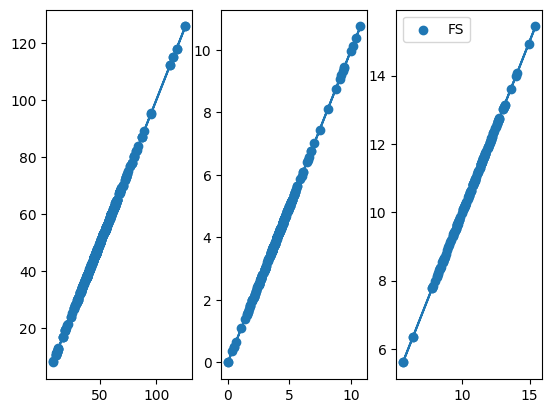

In [99]:
figure, ax = plt.subplots(1,3)
ax[0].scatter(cs_y, cs_y, label='CS')
ax[0].plot(cs_y, cs_y)
ax[1].scatter(ts_y, ts_y, label='TS')
ax[1].plot(ts_y, ts_y)
ax[2].scatter(fs_y, fs_y, label='FS')
ax[2].plot(fs_y, fs_y)
plt.legend()

In [100]:
print(cs_x.shape, ts_x.shape, fs_x.shape)

(425, 15) (259, 15) (152, 15)


In [101]:
print(cs_y.shape, ts_y.shape, fs_y.shape)

(425,) (259,) (152,)


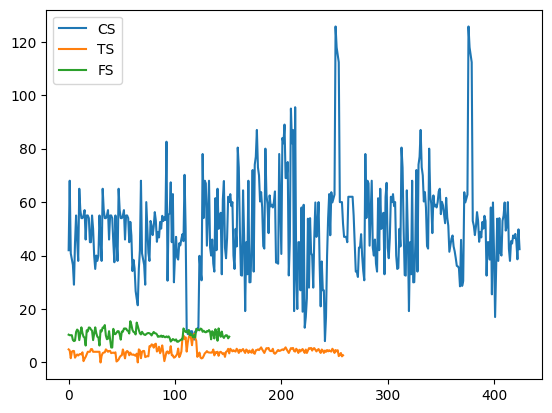

In [102]:
plt.plot(range(len(cs_y)), cs_y, label='CS')
plt.plot(range(len(ts_y)), ts_y, label='TS')
plt.plot(range(len(fs_y)), fs_y, label='FS')
plt.legend()

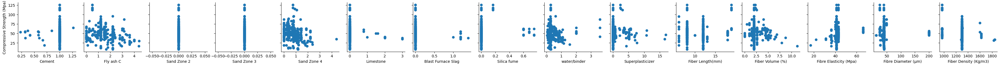

In [103]:
cols = df_cs.columns
y_cols = cols[-1]
x_cols = cols[:-1]
g = sns.PairGrid(df_cs, x_vars=x_cols, y_vars=y_cols)
g = g.map(plt.scatter)

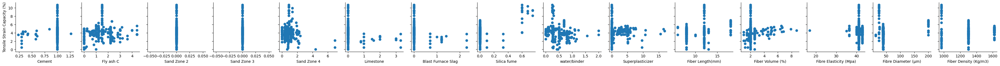

In [104]:
cols = df_ts.columns
y_cols = cols[-1]
x_cols = cols[:-1]
g = sns.PairGrid(df_ts, x_vars=x_cols, y_vars=y_cols)
g = g.map(plt.scatter)

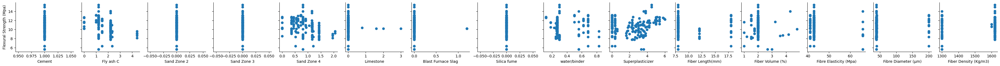

In [105]:
cols = df_fs.columns
y_cols = cols[-1]
x_cols = cols[:-1]
g = sns.PairGrid(df_fs, x_vars=x_cols, y_vars=y_cols)
g = g.map(plt.scatter)

In [106]:
total_x = pd.concat([cs_x, ts_x, fs_x], axis=0)
total_x.shape

(836, 15)

<Axes: >

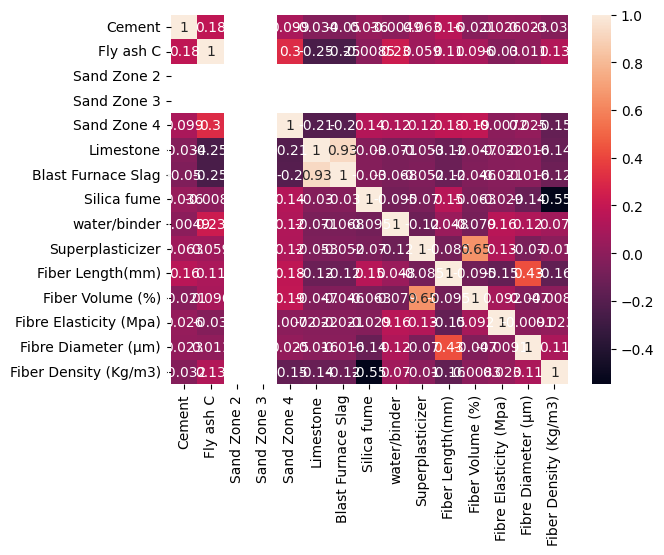

In [107]:
cs_corr = cs_x.corr()
sns.heatmap(cs_corr, annot=True)

<Axes: >

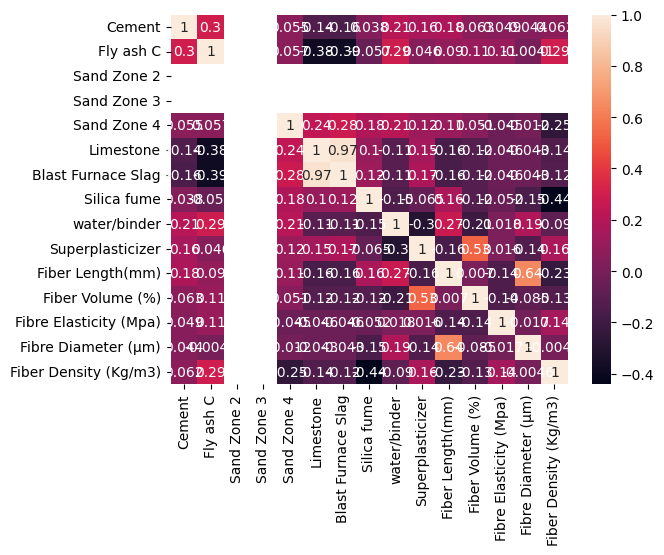

In [108]:
ts_corr = ts_x.corr()
sns.heatmap(ts_corr, annot=True)

<Axes: >

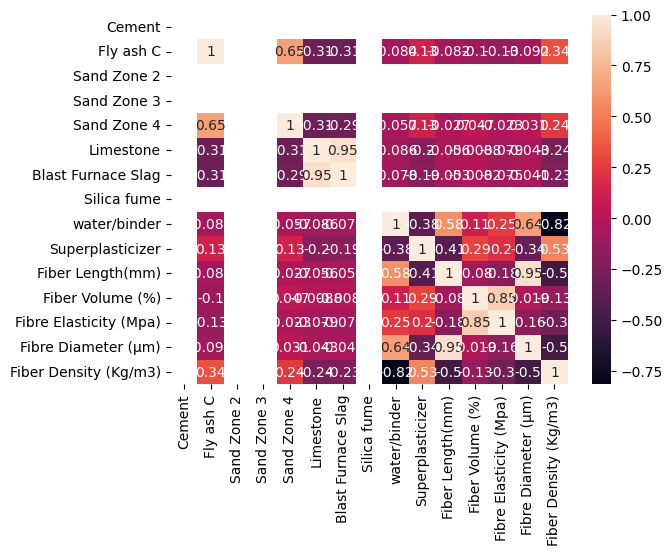

In [109]:
fs_corr = fs_x.corr()
sns.heatmap(fs_corr, annot=True)
# nan because values are constant

In [110]:
from sklearn import preprocessing
min_max_scaler = preprocessing.MinMaxScaler()
cs_x, ts_x, fs_x = min_max_scaler.fit_transform(cs_x), min_max_scaler.fit_transform(ts_x), min_max_scaler.fit_transform(fs_x)

<Axes: >

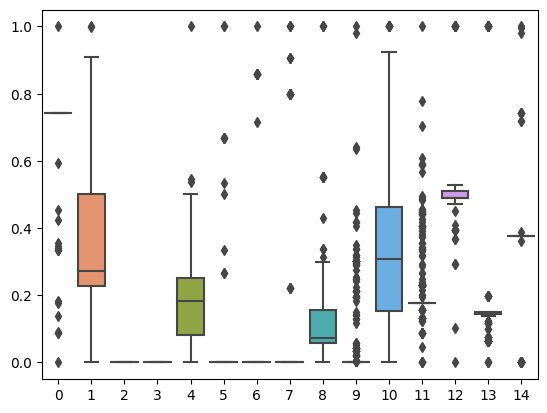

In [111]:
sns.boxplot(data=cs_x)

<Axes: >

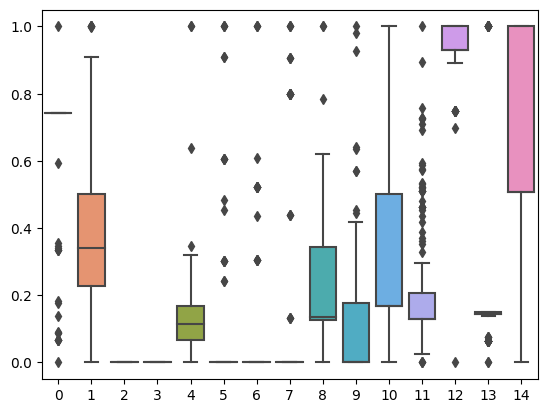

In [112]:
sns.boxplot(data=ts_x)

<Axes: >

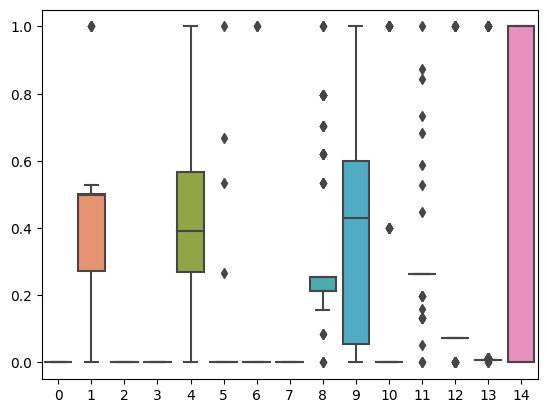

In [113]:
sns.boxplot(data=fs_x)

In [114]:
cs_x_train, cs_x_test, cs_y_train, cs_y_test = train_test_split(cs_x, cs_y, random_state=42, test_size=0.2, shuffle=True)
print(cs_x_train.shape, cs_y_train.shape, cs_x_test.shape)

(340, 15) (340,) (85, 15)


In [115]:
ts_x_train, ts_x_test, ts_y_train, ts_y_test = train_test_split(ts_x, ts_y, random_state=42, test_size=0.2, shuffle=True)
print(ts_x_train.shape, ts_y_train.shape, ts_x_test.shape)

(207, 15) (207,) (52, 15)


In [116]:
fs_x_train, fs_x_test, fs_y_train, fs_y_test = train_test_split(fs_x, fs_y, random_state=42, test_size=0.2, shuffle=True)
print(fs_x_train.shape, fs_y_train.shape, fs_x_test.shape)

(121, 15) (121,) (31, 15)


## Models

In [117]:
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error
from sklearn.model_selection import KFold, cross_val_score

final_preds = {'CS': [], 'TS': [], 'FS': []}
final_mae = {'CS': [], 'TS': [], 'FS': []}
final_rmse = {'CS': [], 'TS': [], 'FS': []}
final_r2 = {'CS': [], 'TS': [], 'FS': []}

def pipeline(model, train_x, train_y, test_x, test_y, sheet_name):
    model.fit(train_x, train_y)
    pred_train = model.predict(train_x)
    pred_df = pd.DataFrame(pred_train, columns=[str(model)])
    pred_test = model.predict(test_x)
    fig, ax = plt.subplots(1,2)
    fig.set_figheight(10)
    fig.set_figwidth(30)
    ax[0].plot(train_y.values, train_y.values)
    ax[0].plot(1.2*train_y.values, train_y.values, '-')
    ax[0].plot(0.8*train_y.values, train_y.values, '-')
    ax[0].scatter(train_y.values, pred_train)
    mae = []
    print('Train r2: ', r2_score(train_y, pred_train))
    print('Train MAE: ', mean_absolute_error(train_y, pred_train))
    mae.append(mean_absolute_error(train_y, pred_train))
    print('Train RMSE: ', np.sqrt(mean_squared_error(train_y, pred_train)))
    print('Test r2: ', r2_score(test_y, pred_test))
    print('Test MAE: ', mean_absolute_error(test_y, pred_test))
    mae.append(mean_absolute_error(test_y, pred_test))
    print('Test RMSE: ', np.sqrt(mean_squared_error(test_y, pred_test)))
    print('Scatter Index:', np.sqrt(mean_squared_error(train_y, pred_train))/np.mean(pred_train)*100)

    cv = KFold(n_splits=5)
    scores = cross_val_score(model, train_x, train_y, scoring='neg_mean_absolute_error', cv=cv)
    print('K Fold MAE:', -np.mean(scores))
    mae.append(-np.mean(scores))

    ax[1].bar(['Train', 'Test', 'KFold'], mae)

    figure, axis = plt.subplots(2, 1)
    figure.set_figheight(15)
    figure.set_figwidth(30)
    final_preds[sheet_name].append({str(model): pred_train})
    final_mae[sheet_name].append({str(model): mae[-1]})
    final_r2[sheet_name].append({str(model): r2_score(train_y, pred_train)})
    final_rmse[sheet_name].append({str(model): np.sqrt(mean_squared_error(train_y, pred_train))})

    axis[0].plot(range(len(test_x)), pred_test, label='Pred')
    axis[0].plot(range(len(test_x)), test_y, label='Orig')

    axis[1].plot(range(len(train_x)), pred_train, label='Pred')
    axis[1].plot(range(len(train_x)), train_y, label='Orig')
    plt.legend()
    plt.title(str(model))


### Linear Regression

Train r2:  0.26701756875342775
Train MAE:  11.691731164209514
Train RMSE:  16.087439038942975
Test r2:  0.05575376083792849
Test MAE:  10.597169840726165
Test RMSE:  13.93742043105285
Scatter Index: 31.94907517008524
K Fold MAE: 12.254743847553613
Coefficients: [ 1.02630612e+01 -1.81828913e+01  2.48689958e-14  0.00000000e+00
 -3.32491985e+01 -5.20354688e+01  9.88424173e+00 -1.43712144e+01
 -3.86552378e-01  4.70701459e-01  6.87908234e-01 -6.30926680e+00
  3.09410056e+01  1.57710107e+00 -6.64046698e+01]


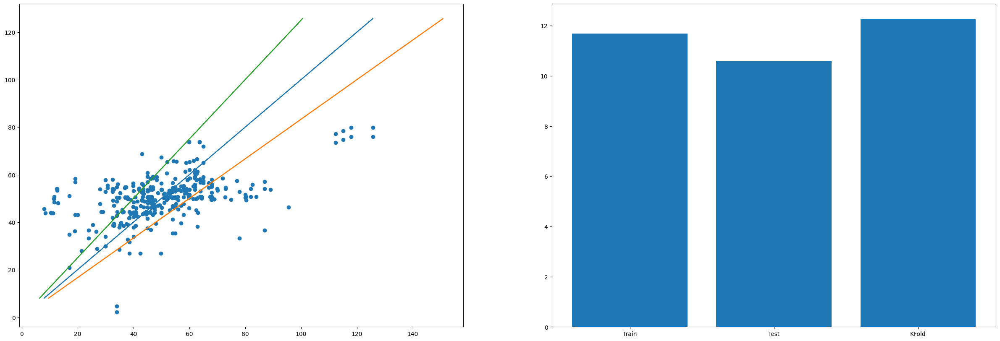

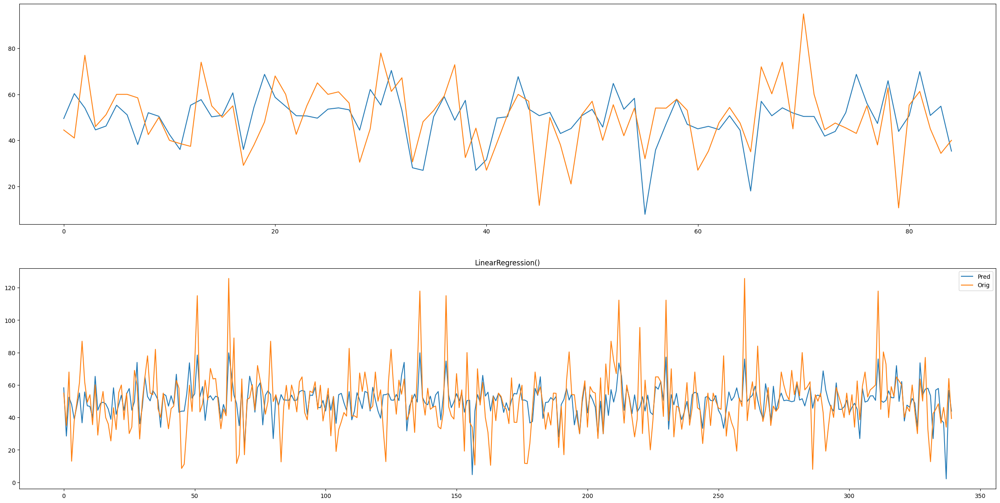

In [118]:
from sklearn.linear_model import LinearRegression
train_cs = pd.DataFrame(cs_y_train.values, columns=['Actual'])
model = LinearRegression()
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')
print('Coefficients:', model.coef_)

Train r2:  0.6270964969221657
Train MAE:  0.7255856634237547
Train RMSE:  0.9524651318252711
Test r2:  0.6427509904065972
Test MAE:  0.8549903019728758
Test RMSE:  1.1540359071152277
Scatter Index: 22.413491989749463
K Fold MAE: 0.7789234203223889
Coefficients: [ 8.47800169e-01 -3.97605439e-01  2.44249065e-15 -1.55431223e-15
 -2.01153527e+00 -2.20203295e+00 -3.56292972e-01  6.42491153e+00
 -4.00934390e-01 -3.58782195e-01 -1.54645932e-01  2.38919117e+00
 -6.24169396e-01  2.59976995e+00  1.38833399e+00]


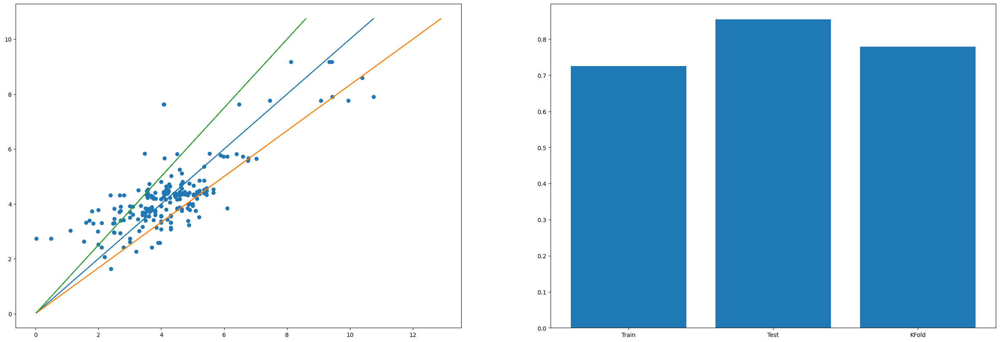

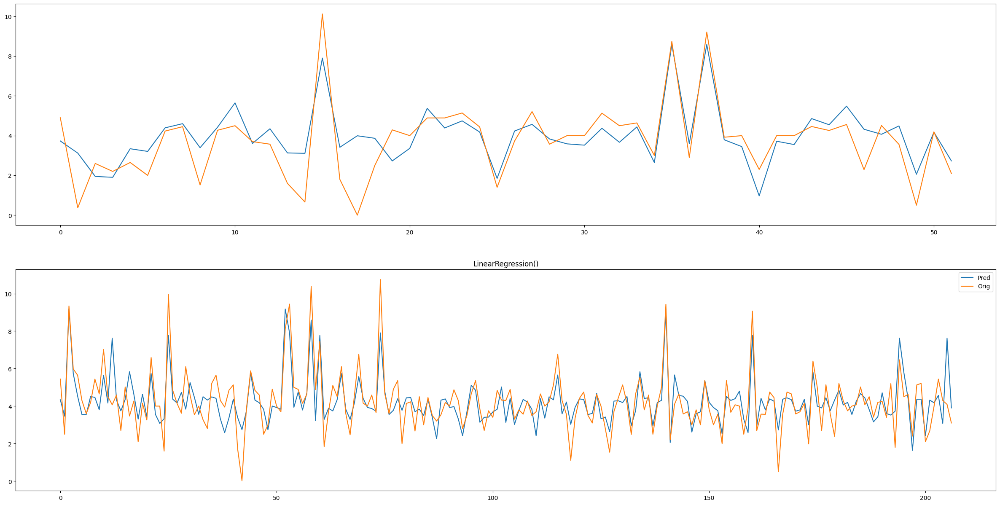

In [119]:
train_ts = pd.DataFrame(ts_y_train.values, columns=['Actual'])
model = LinearRegression()
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')
print('Coefficients:', model.coef_)

Train r2:  0.38759722611823977
Train MAE:  1.0848655986887643
Train RMSE:  1.3836491735775744
Test r2:  0.2207390165966392
Test MAE:  0.951951228589953
Test RMSE:  1.2087443624436973
Scatter Index: 13.201718210576304
K Fold MAE: 1.2481915893494295
Coefficients: [ 0.00000000e+00 -3.25859237e+00 -1.11022302e-15  2.22044605e-16
 -2.05002234e+00 -3.47048675e+00 -9.37615597e-01  1.77635684e-15
 -6.33079478e-01  9.06691002e-01 -3.71621677e+00  7.53251843e+00
 -6.29387698e+00  3.02257307e+00 -4.92827826e-01]


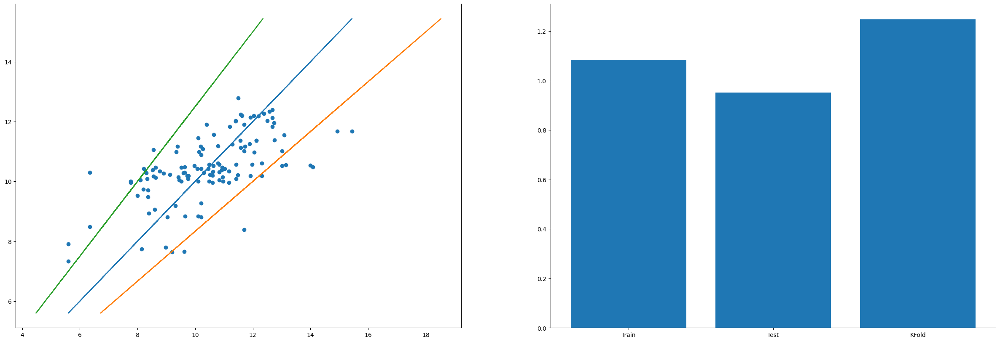

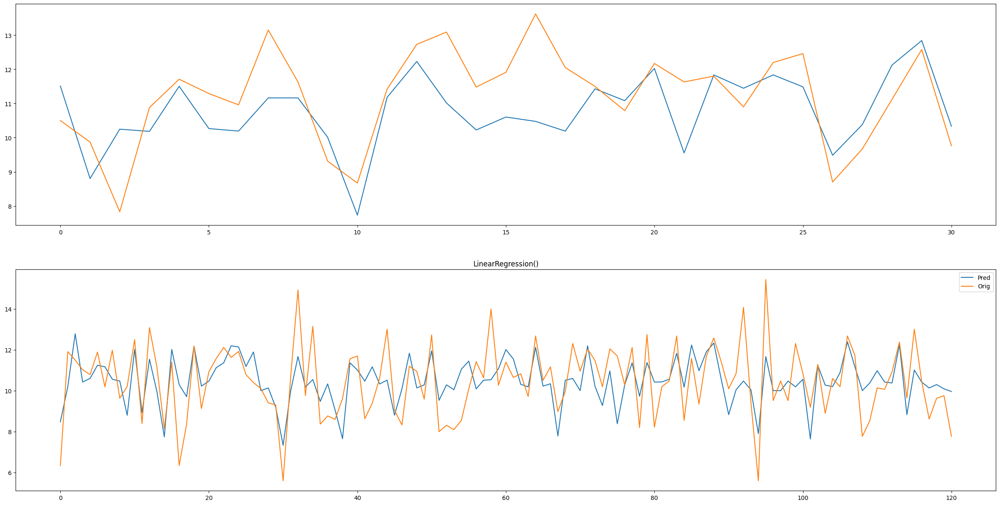

In [120]:
train_fs = pd.DataFrame(fs_y_train.values, columns=['Actual'])
model = LinearRegression()
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')
print('Coefficients:', model.coef_)

### Ridge Regression

Train r2:  0.261741640857427
Train MAE:  11.662742538499874
Train RMSE:  16.14523304575996
Test r2:  0.09446655679291349
Test MAE:  10.287577401217542
Test RMSE:  13.648722887505599
Scatter Index: 32.06385198842821
K Fold MAE: 12.119164142695553
Coefficients: [  8.48276162 -18.34003959   0.           0.         -29.43533738
 -17.42193252 -10.23890848  -9.71482813  -0.16906964   0.81586915
   1.2749765   -5.78896591  26.38943918   0.89826127 -56.11758781]


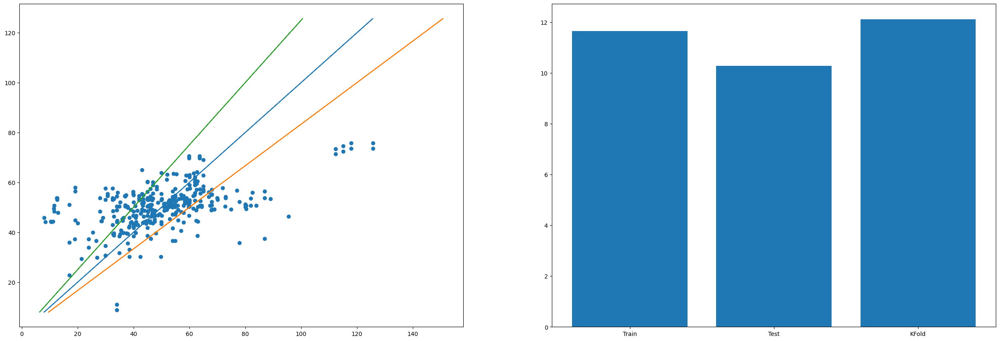

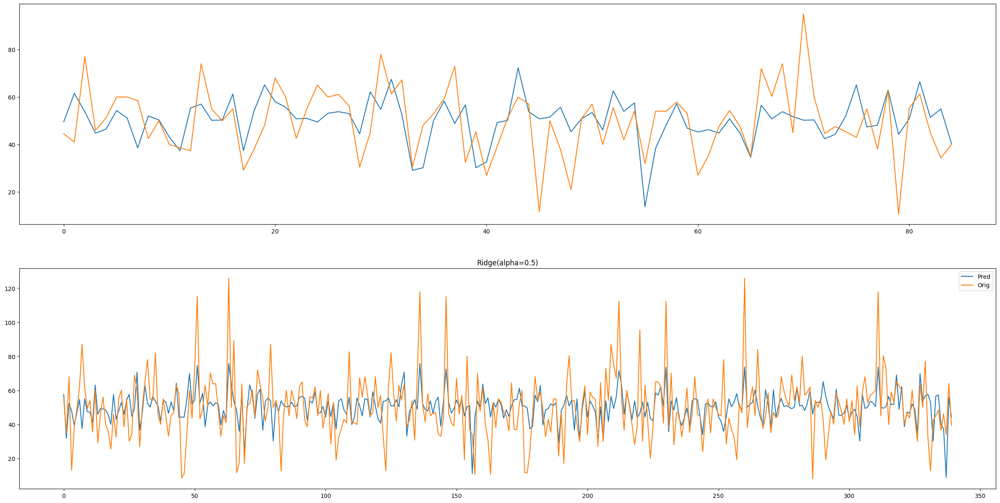

In [121]:
from sklearn.linear_model import Ridge
model = Ridge(alpha=0.5)
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')
print('Coefficients:', model.coef_)

Train r2:  0.6196831081897167
Train MAE:  0.7281517874598928
Train RMSE:  0.9618861285663517
Test r2:  0.6248811271574104
Test MAE:  0.8550938284456024
Test RMSE:  1.1825465965169688
Scatter Index: 22.63518770115782
K Fold MAE: 0.7808058387458405
Coefficients: [ 0.74227344 -0.27759658  0.          0.         -1.6721033  -1.31529824
 -1.07240982  5.70273742 -0.64688827 -0.15686514  0.23508233  1.775117
 -0.39791664  2.09499864  1.17353657]


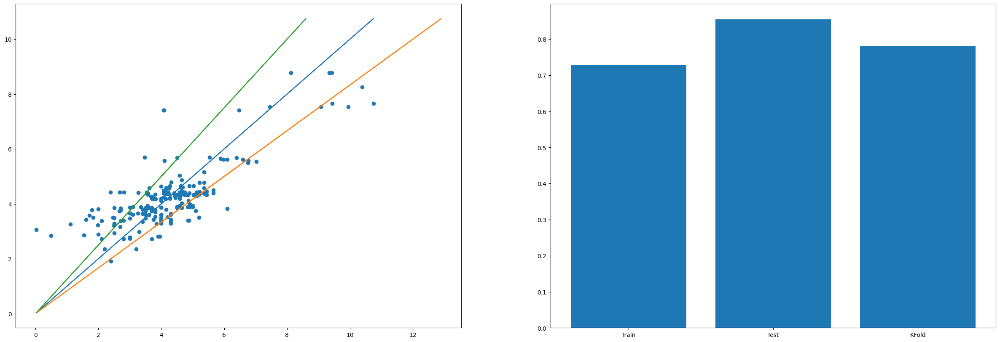

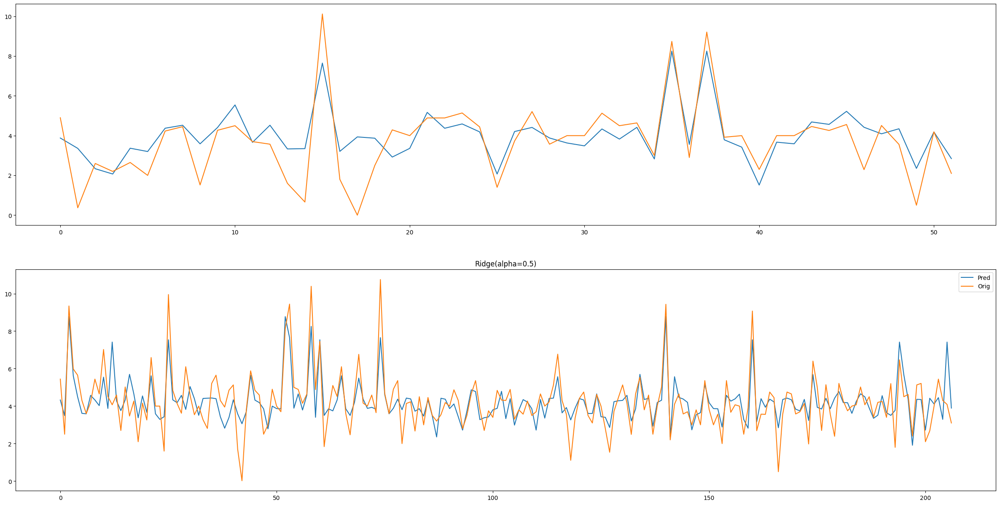

In [122]:
model = Ridge(alpha=0.5)
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')
print('Coefficients:', model.coef_)

Train r2:  0.34560822206494357
Train MAE:  1.0886403995106375
Train RMSE:  1.4302973383558275
Test r2:  0.24317306144713713
Test MAE:  0.9274161597964256
Test RMSE:  1.191218107520508
Scatter Index: 13.646799187895656
K Fold MAE: 1.1857199789209196
Coefficients: [ 0.         -3.07649014  0.          0.         -1.6801209  -1.11767185
 -1.21166417  0.         -0.3035784   0.9321457  -1.9172921   2.62298558
 -2.99466834  1.89569295  0.19298614]


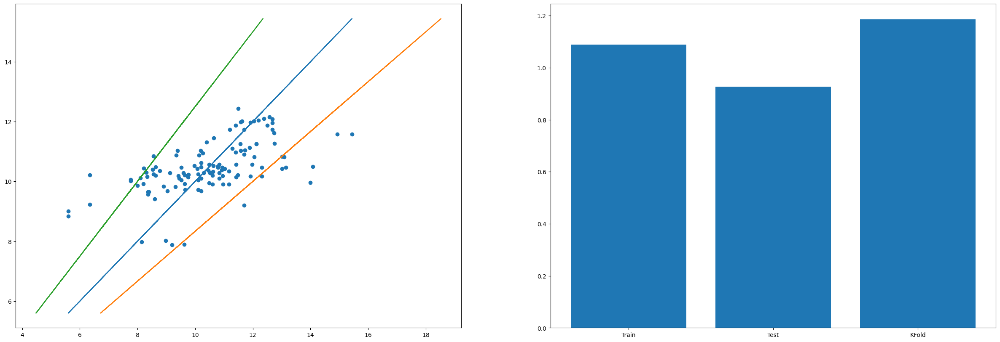

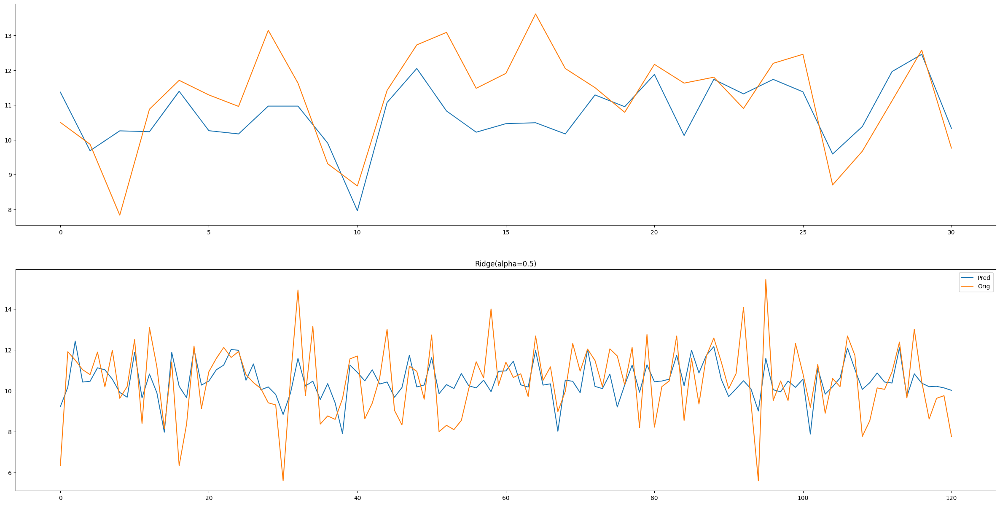

In [123]:
model = Ridge(alpha=0.5)
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')
print('Coefficients:', model.coef_)

### Lasso Regression

Train r2:  0.2590307405817245
Train MAE:  11.716492209200702
Train RMSE:  16.1748487015885
Test r2:  0.049019530721855054
Test MAE:  10.7179289844115
Test RMSE:  13.987031984425224
Scatter Index: 32.122667615451775
K Fold MAE: 12.175637428164386
Coefficients: [  3.82193607 -17.13067895   0.           0.         -29.59605415
 -14.52713146  -8.45031978  -8.90885261   0.          -0.
   0.56396516  -1.15088896  24.85510993   0.         -58.10099343]


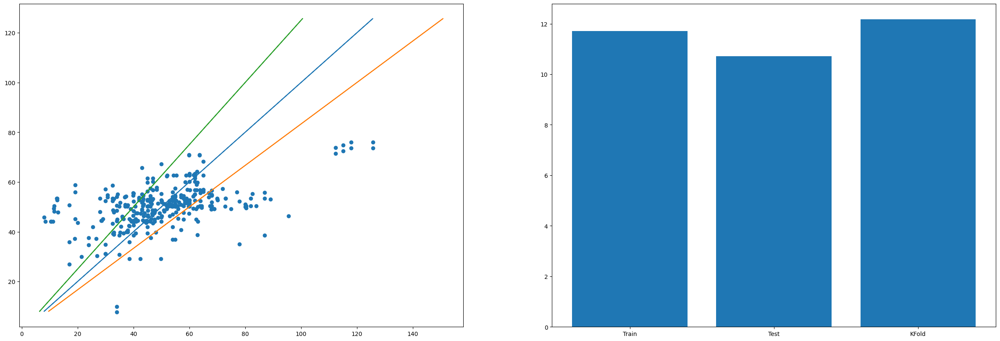

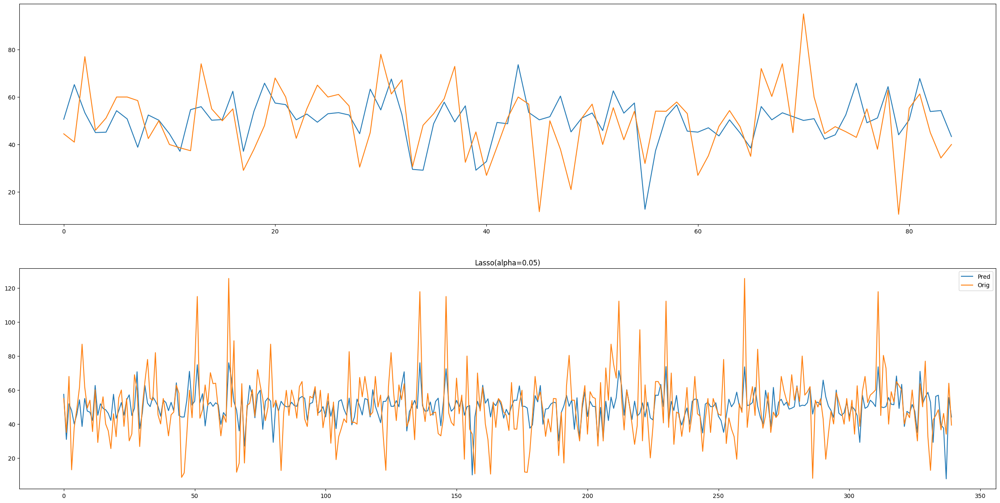

In [124]:
from sklearn.linear_model import Lasso
model = Lasso(alpha=0.05)
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')
print('Coefficients:', model.coef_)

Train r2:  0.607925406829699
Train MAE:  0.7411641695779764
Train RMSE:  0.9766415671731293
Test r2:  0.6015238910517764
Test MAE:  0.8833211274946992
Test RMSE:  1.2188070258718904
Scatter Index: 22.982413960647733
K Fold MAE: 0.8032913532974435
Coefficients: [ 0.21004189 -0.          0.          0.         -1.31456032 -2.06562413
 -0.          5.76969384 -0.2969686   0.          0.          1.48182134
 -0.          2.14792591  1.05783148]


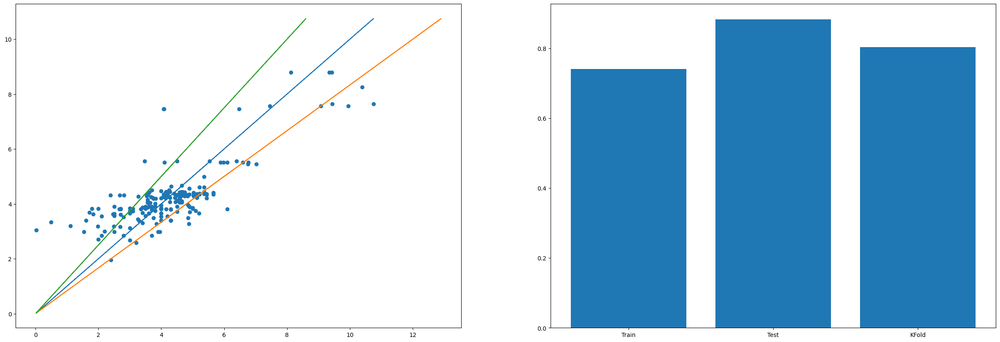

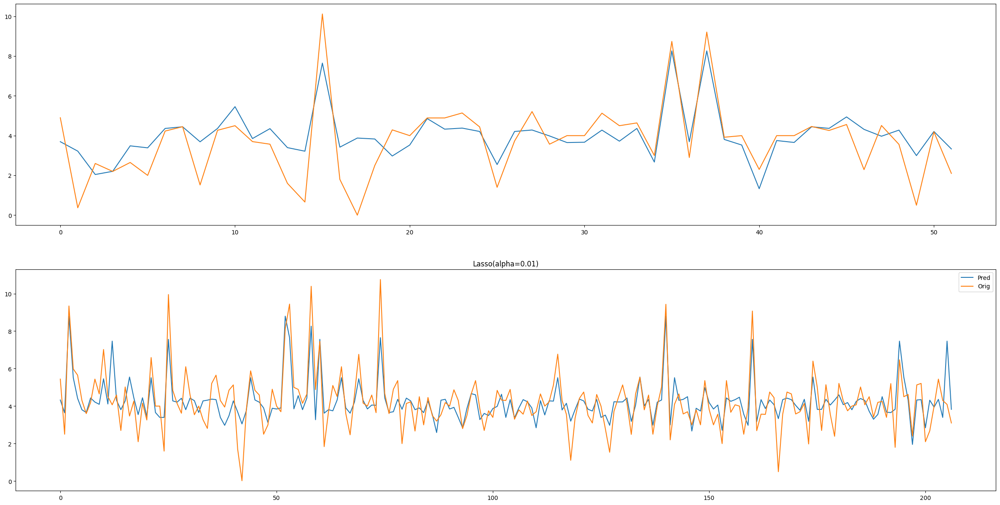

In [125]:
model = Lasso(alpha=0.01)
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')
print('Coefficients:', model.coef_)

Train r2:  0.38686366252818516
Train MAE:  1.0823466431845772
Train RMSE:  1.384477624173134
Test r2:  0.22411868364552534
Test MAE:  0.9478567003852443
Test RMSE:  1.2061203426645895
Scatter Index: 13.209622650171838
K Fold MAE: 1.2241751461574484
Coefficients: [ 0.         -3.34483141  0.          0.         -1.94541518 -2.93569906
 -1.07542642  0.         -0.34137205  0.89265041 -3.31804842  7.18762761
 -6.04572817  2.62484414 -0.31340668]


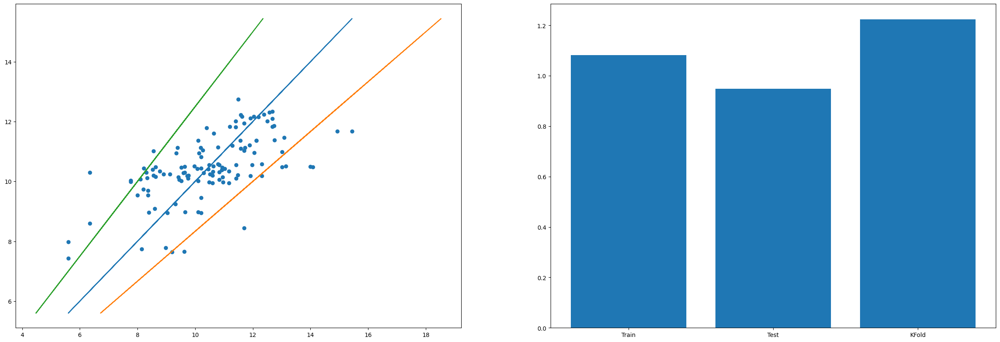

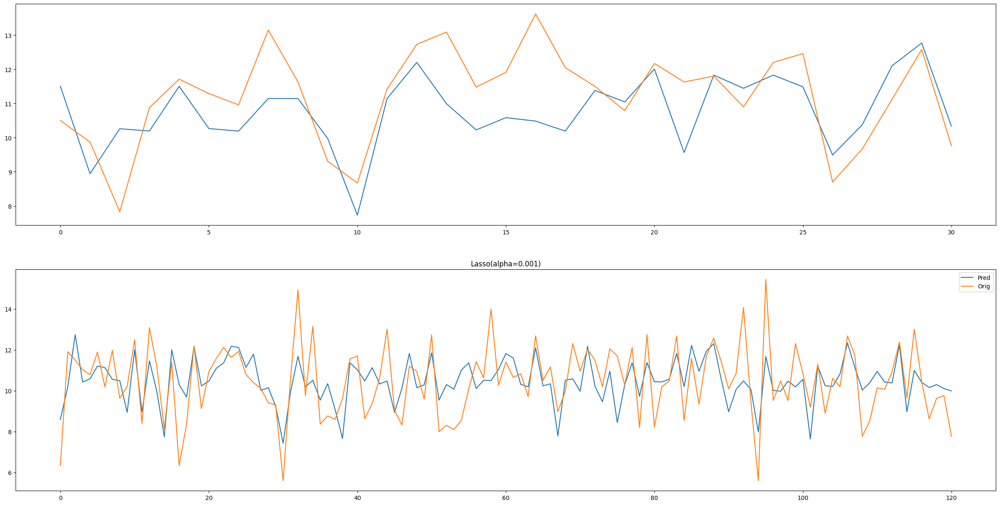

In [126]:
model = Lasso(alpha=0.001)
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')
print('Coefficients:', model.coef_)

### Symbolic Regression

In [127]:
# from gplearn.genetic import SymbolicRegressor

# function_set = ['add', 'sub', 'mul', 'div','cos','sin','neg','inv']
# est_gp = SymbolicRegressor(population_size=5000,function_set=function_set,
#                            generations=40, stopping_criteria=0.01,
#                            p_crossover=0.7, p_subtree_mutation=0.1,
#                            p_hoist_mutation=0.05, p_point_mutation=0.1,
#                            max_samples=0.9, verbose=1,
#                            parsimony_coefficient=0.01, random_state=0)
# converter = {
#     'sub': lambda x, y : x - y,
#     'div': lambda x, y : x/y,
#     'mul': lambda x, y : x*y,
#     'add': lambda x, y : x + y,
#     'neg': lambda x    : -x,
#     'pow': lambda x, y : x**y,
#     'sin': lambda x    : sin(x),
#     'cos': lambda x    : cos(x),
#     'inv': lambda x: 1/x,
#     'sqrt': lambda x: x**0.5,
#     'pow3': lambda x: x**3
# }

# est_gp.fit(cs_x_train, cs_y_train)
# print('R2:',est_gp.score(cs_x_test,cs_y_test))

In [128]:
# from sympy import *
# next_e = sympify((est_gp._program), locals=converter)
# next_e

In [129]:
# preds = est_gp.predict(cs_x_test)
# plt.plot(range(len(cs_x_test)), preds, label='Pred')
# plt.plot(range(len(cs_x_test)), cs_y_test, label='Orig')
# plt.legend()
# plt.title(str(model))

### Decision Tree Regressor

Train r2:  0.5629528161375126
Train MAE:  8.965383728903946
Train RMSE:  12.422365255947533
Test r2:  0.27517125420856836
Test MAE:  9.028175980015671
Test RMSE:  12.211175511737665
Scatter Index: 24.670370491647947
K Fold MAE: 11.829732791543261


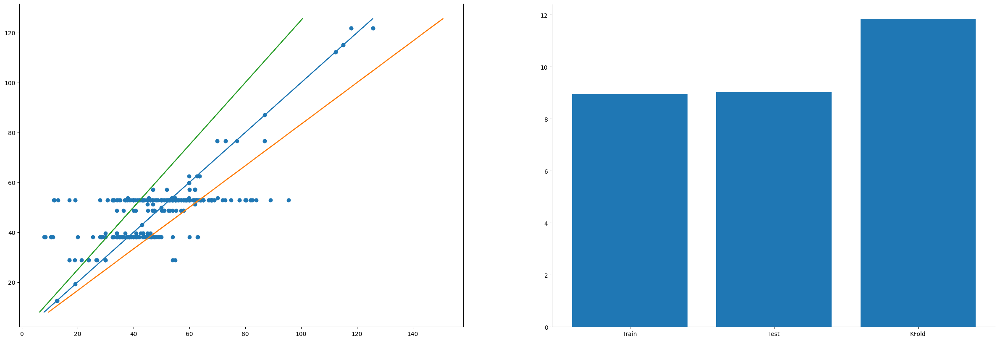

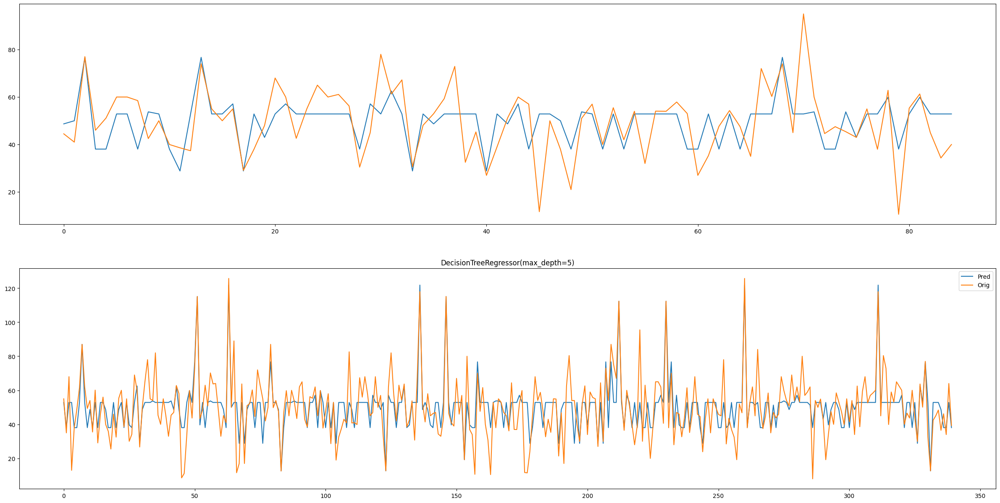

In [130]:
from sklearn.tree import DecisionTreeRegressor
model = DecisionTreeRegressor(max_depth = 5)
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')

In [131]:
from sklearn import tree
text_representation = tree.export_text(model)
print(text_representation)


|--- feature_14 <= 0.18
|   |--- feature_1 <= 0.23
|   |   |--- feature_8 <= 0.06
|   |   |   |--- value: [50.00]
|   |   |--- feature_8 >  0.06
|   |   |   |--- feature_4 <= 0.19
|   |   |   |   |--- feature_13 <= 0.10
|   |   |   |   |   |--- value: [121.81]
|   |   |   |   |--- feature_13 >  0.10
|   |   |   |   |   |--- value: [121.81]
|   |   |   |--- feature_4 >  0.19
|   |   |   |   |--- feature_4 <= 0.23
|   |   |   |   |   |--- value: [115.08]
|   |   |   |   |--- feature_4 >  0.23
|   |   |   |   |   |--- value: [112.33]
|   |--- feature_1 >  0.23
|   |   |--- feature_8 <= 0.20
|   |   |   |--- feature_8 <= 0.12
|   |   |   |   |--- feature_9 <= 0.00
|   |   |   |   |   |--- value: [51.33]
|   |   |   |   |--- feature_9 >  0.00
|   |   |   |   |   |--- value: [57.11]
|   |   |   |--- feature_8 >  0.12
|   |   |   |   |--- feature_9 <= 0.12
|   |   |   |   |   |--- value: [62.53]
|   |   |   |   |--- feature_9 >  0.12
|   |   |   |   |   |--- value: [59.88]
|   |   |--- featur

Train r2:  0.7409206826524035
Train MAE:  0.6120575267921594
Train RMSE:  0.7939026037172423
Test r2:  0.6114891690088821
Test MAE:  0.9279467838196288
Test RMSE:  1.2034702819459173
Scatter Index: 18.682184842774873
K Fold MAE: 0.7910269444220491


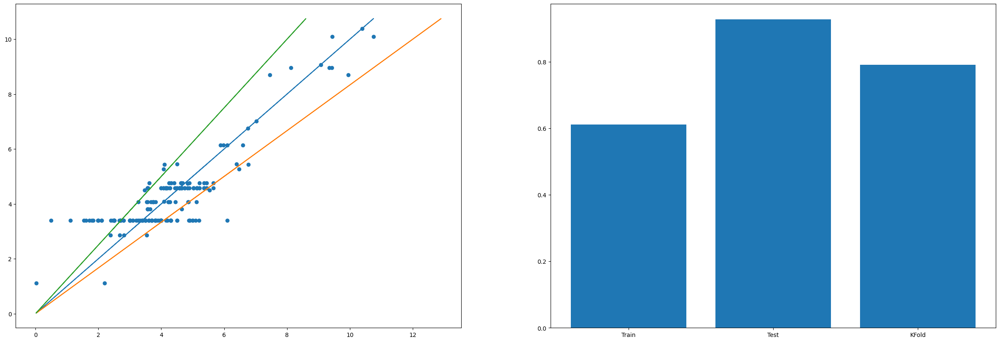

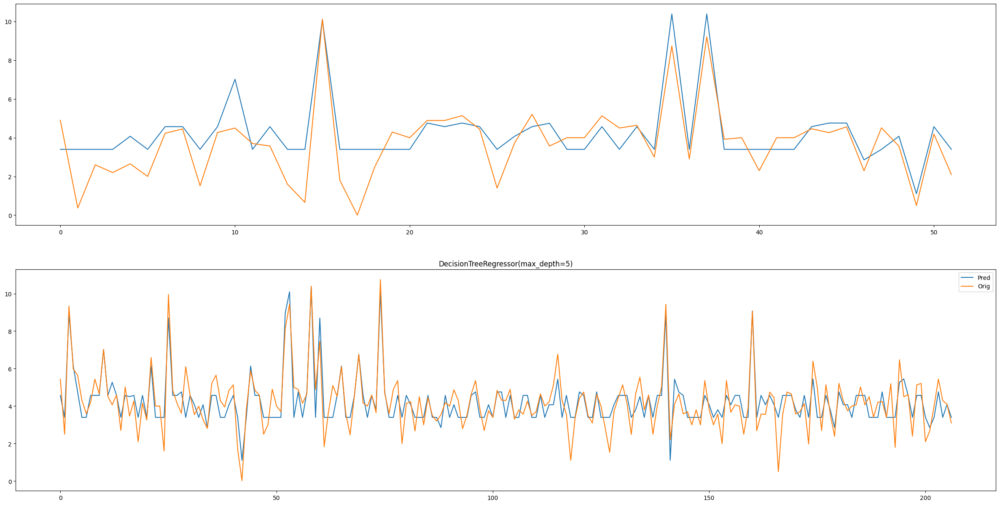

In [132]:
model = DecisionTreeRegressor(max_depth = 5)
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')

In [133]:
text_representation = tree.export_text(model)
print(text_representation)

|--- feature_7 <= 0.62
|   |--- feature_13 <= 0.57
|   |   |--- feature_14 <= 0.75
|   |   |   |--- feature_11 <= 0.31
|   |   |   |   |--- feature_4 <= 0.49
|   |   |   |   |   |--- value: [3.40]
|   |   |   |   |--- feature_4 >  0.49
|   |   |   |   |   |--- value: [1.11]
|   |   |   |--- feature_11 >  0.31
|   |   |   |   |--- feature_11 <= 0.52
|   |   |   |   |   |--- value: [4.07]
|   |   |   |   |--- feature_11 >  0.52
|   |   |   |   |   |--- value: [4.76]
|   |   |--- feature_14 >  0.75
|   |   |   |--- feature_11 <= 0.11
|   |   |   |   |--- feature_12 <= 0.98
|   |   |   |   |   |--- value: [4.75]
|   |   |   |   |--- feature_12 >  0.98
|   |   |   |   |   |--- value: [2.85]
|   |   |   |--- feature_11 >  0.11
|   |   |   |   |--- feature_1 <= 0.95
|   |   |   |   |   |--- value: [4.57]
|   |   |   |   |--- feature_1 >  0.95
|   |   |   |   |   |--- value: [3.80]
|   |--- feature_13 >  0.57
|   |   |--- feature_4 <= 0.12
|   |   |   |--- feature_1 <= 0.25
|   |   |   |   |--

Train r2:  0.5674059597787815
Train MAE:  0.8094495985791226
Train RMSE:  1.162914215589547
Test r2:  0.22105656739748258
Test MAE:  0.8789527758115078
Test RMSE:  1.2084980541720374
Scatter Index: 11.095634695889792
K Fold MAE: 1.0281153158939014


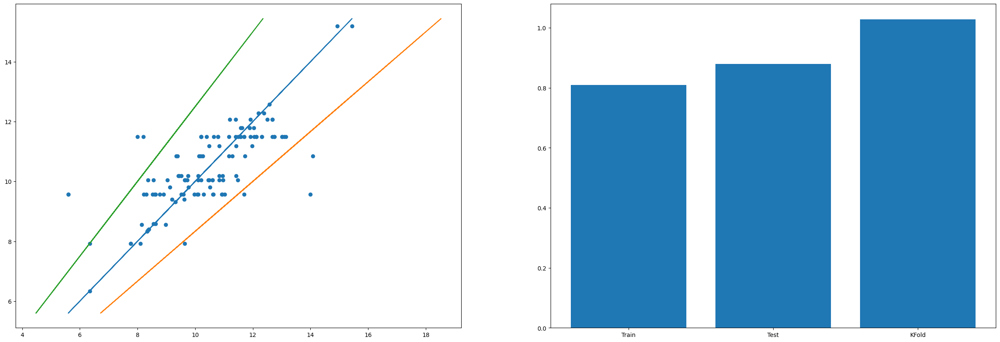

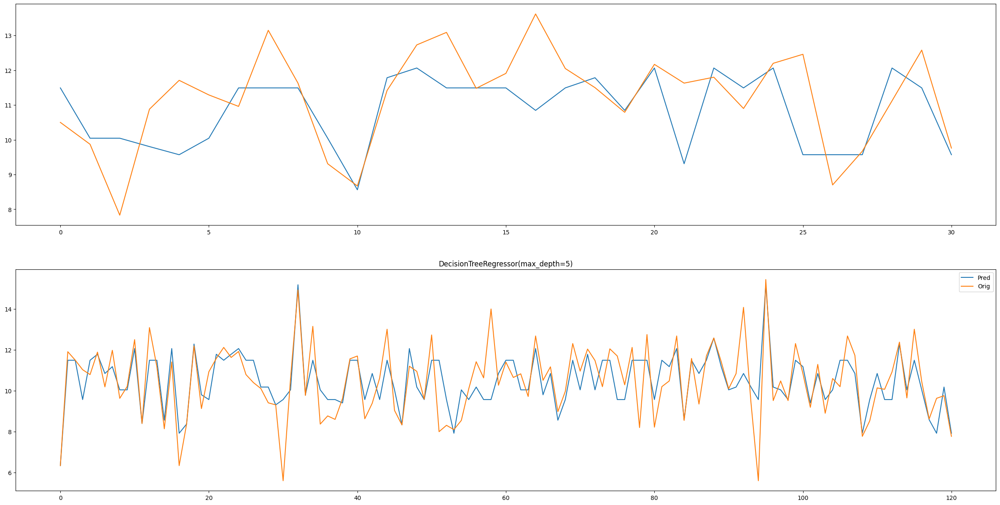

In [134]:
model = DecisionTreeRegressor(max_depth = 5)
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')

In [135]:
text_representation = tree.export_text(model)
print(text_representation)

|--- feature_9 <= 0.66
|   |--- feature_4 <= 0.58
|   |   |--- feature_11 <= 0.09
|   |   |   |--- feature_4 <= 0.28
|   |   |   |   |--- value: [6.34]
|   |   |   |--- feature_4 >  0.28
|   |   |   |   |--- feature_9 <= 0.03
|   |   |   |   |   |--- value: [9.31]
|   |   |   |   |--- feature_9 >  0.03
|   |   |   |   |   |--- value: [8.40]
|   |   |--- feature_11 >  0.09
|   |   |   |--- feature_9 <= 0.40
|   |   |   |   |--- feature_1 <= 0.50
|   |   |   |   |   |--- value: [11.49]
|   |   |   |   |--- feature_1 >  0.50
|   |   |   |   |   |--- value: [10.04]
|   |   |   |--- feature_9 >  0.40
|   |   |   |   |--- feature_1 <= 0.50
|   |   |   |   |   |--- value: [9.57]
|   |   |   |   |--- feature_1 >  0.50
|   |   |   |   |   |--- value: [10.85]
|   |--- feature_4 >  0.58
|   |   |--- feature_8 <= 0.23
|   |   |   |--- feature_9 <= 0.36
|   |   |   |   |--- feature_4 <= 0.98
|   |   |   |   |   |--- value: [8.56]
|   |   |   |   |--- feature_4 >  0.98
|   |   |   |   |   |--- value

### Random Forest

Train r2:  0.6002376019064248
Train MAE:  8.978567390711643
Train RMSE:  11.880674635720643
Test r2:  0.2837860616081952
Test MAE:  8.891727416059162
Test RMSE:  12.138391856655227
Scatter Index: 23.5076339183088
K Fold MAE: 11.00227965772638


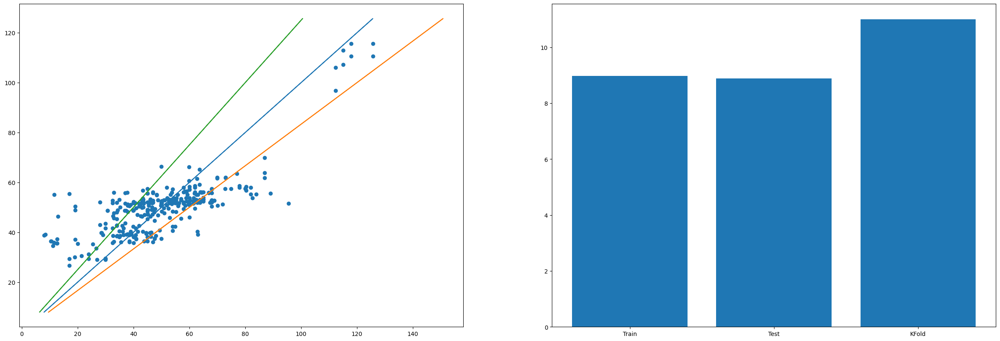

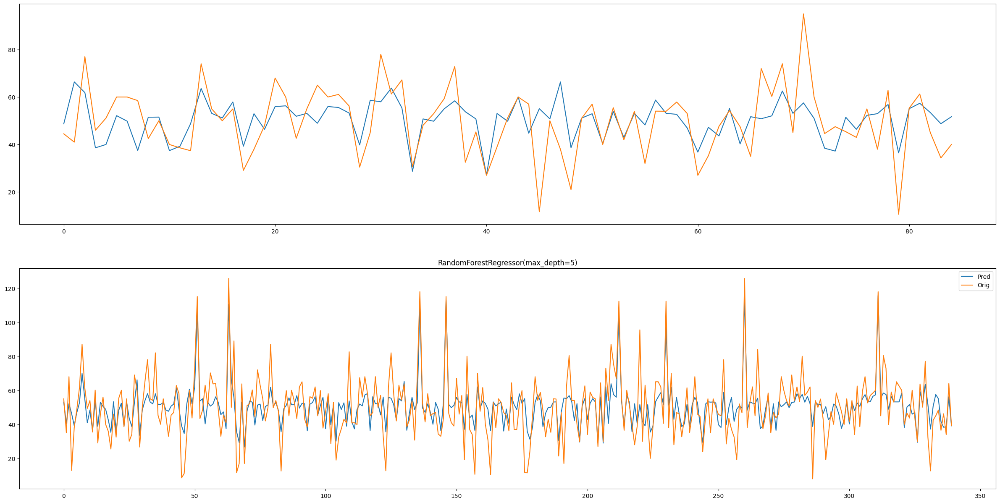

In [136]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor(max_depth = 5)
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')

In [137]:
pickle.dump(model, open('cs.sav', 'wb'))

Train r2:  0.7672720308449565
Train MAE:  0.5925589274719024
Train RMSE:  0.7524456644053873
Test r2:  0.6527904665871764
Test MAE:  0.8323835155873772
Test RMSE:  1.137704892504508
Scatter Index: 17.681435548717197
K Fold MAE: 0.7455628513922882


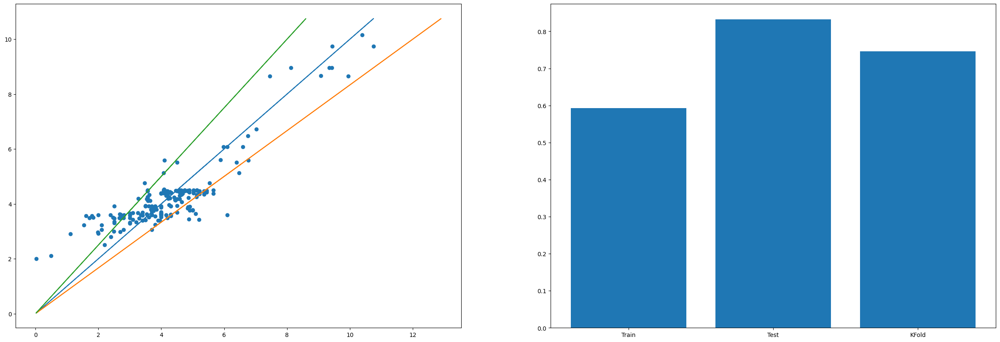

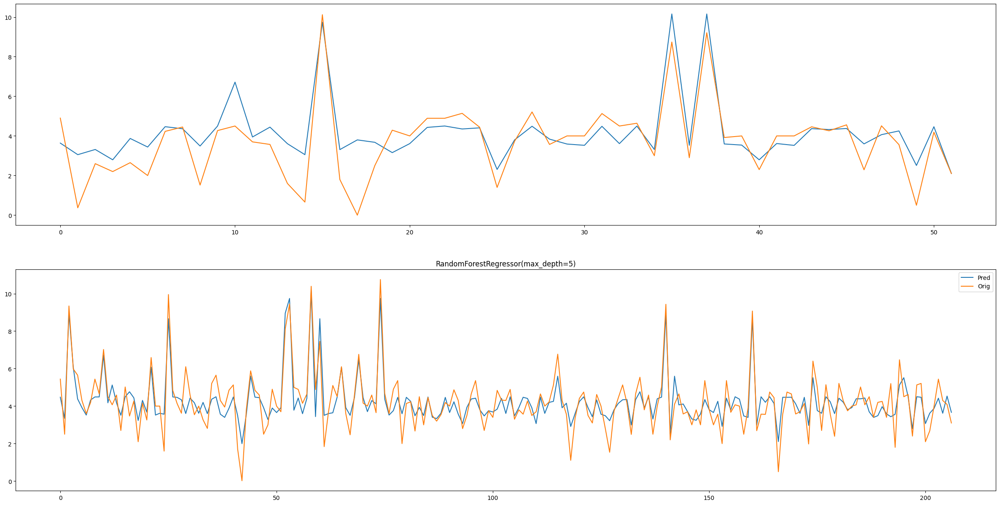

In [138]:
model = RandomForestRegressor(max_depth = 5)
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')

In [139]:
pickle.dump(model, open('ts.sav', 'wb'))

Train r2:  0.5852602637853495
Train MAE:  0.8576656711738194
Train RMSE:  1.1386630739246877
Test r2:  0.3681044931136148
Test MAE:  0.8732530403055357
Test RMSE:  1.0884679083025581
Scatter Index: 10.878352307922835
K Fold MAE: 1.0358354875543927


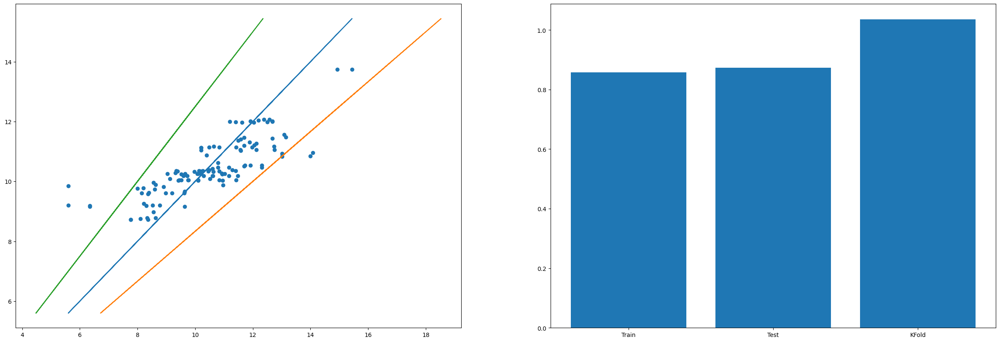

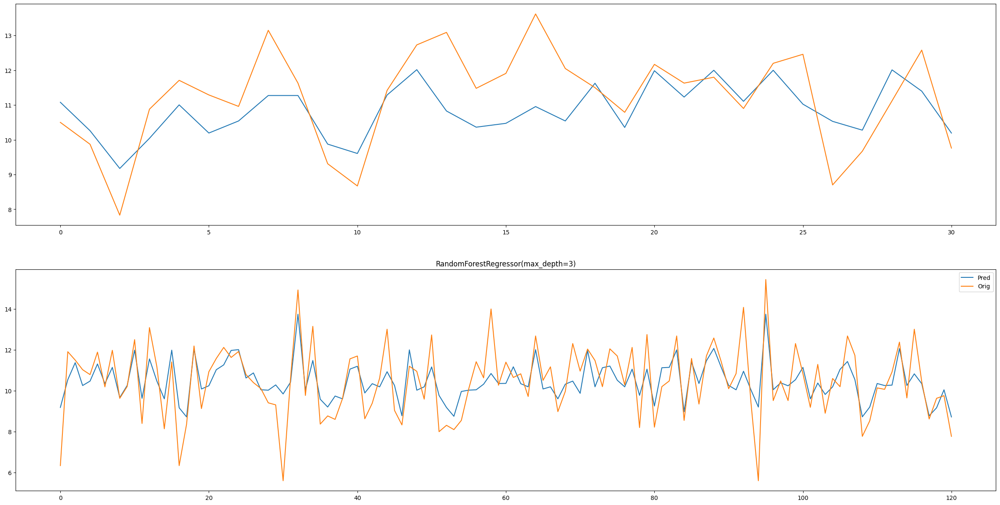

In [140]:
model = RandomForestRegressor(max_depth = 3)
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')

### SVR

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.017 total time=   0.0s
[CV 2/5] END .......C=0.1, gamma=1, kernel=rbf;, score=-0.014 total time=   0.0s
[CV 3/5] END .......C=0.1, gamma=1, kernel=rbf;, score=-0.001 total time=   0.0s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.003 total time=   0.0s
[CV 5/5] END .......C=0.1, gamma=1, kernel=rbf;, score=-0.048 total time=   0.0s
[CV 1/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.002 total time=   0.0s
[CV 2/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.022 total time=   0.0s
[CV 3/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.016 total time=   0.0s
[CV 4/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.005 total time=   0.0s
[CV 5/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.063 total time=   0.0s
[CV 1/5] END ....C=0.1, gamma=0.01, kernel=rbf;, score=-0.004 total time=   0.0s
[CV 2/5] END ....C=0.1, gamma=0.01, kernel=rbf;

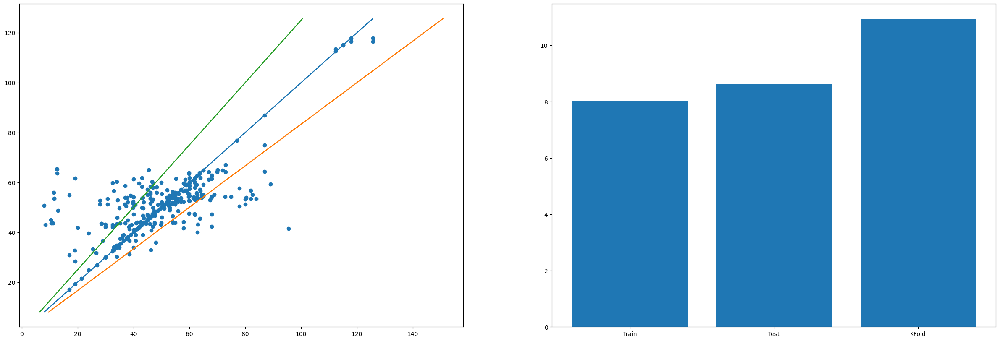

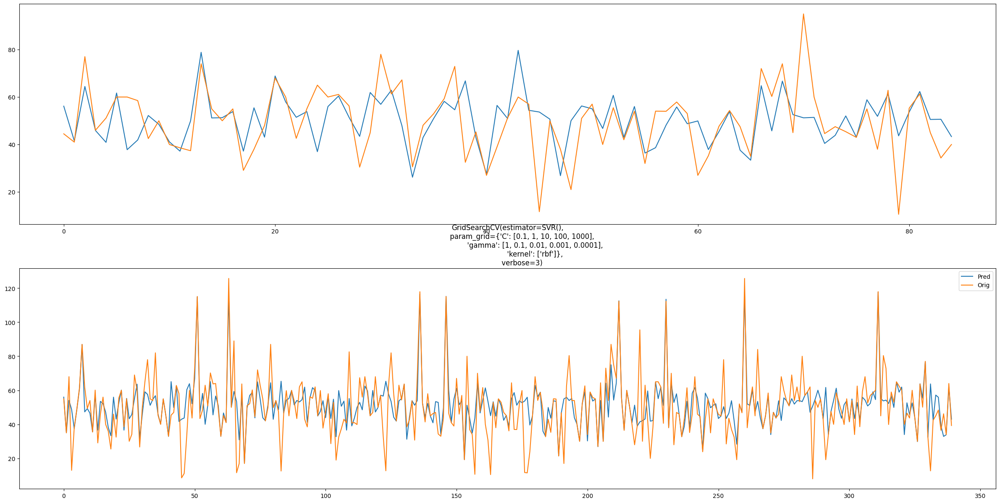

In [141]:
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
  
# defining parameter range
param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']}
grid = GridSearchCV(SVR(), param_grid, refit = True, verbose = 3)
pipeline(grid, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.089 total time=   0.0s
[CV 2/5] END .......C=0.1, gamma=1, kernel=rbf;, score=-0.012 total time=   0.0s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.266 total time=   0.0s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.178 total time=   0.0s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.161 total time=   0.0s
[CV 1/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.041 total time=   0.0s
[CV 2/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.100 total time=   0.0s
[CV 3/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.057 total time=   0.0s
[CV 4/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.033 total time=   0.0s
[CV 5/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.041 total time=   0.0s
[CV 1/5] END ....C=0.1, gamma=0.01, kernel=rbf;, score=-0.063 total time=   0.0s
[CV 2/5] END ....C=0.1, gamma=0.01, kernel=rbf;

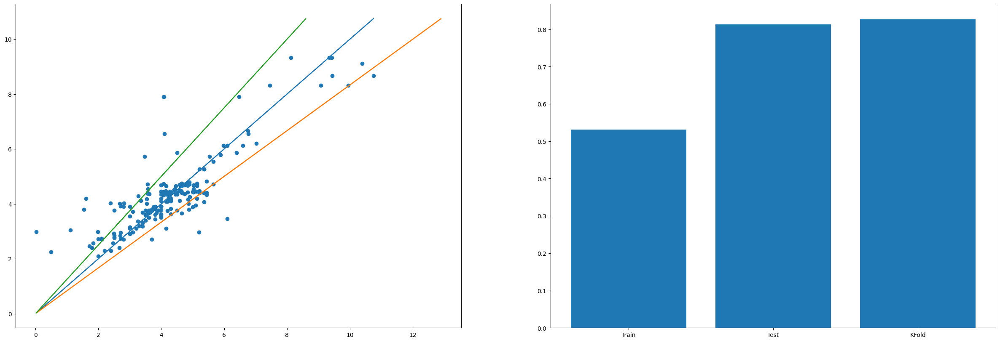

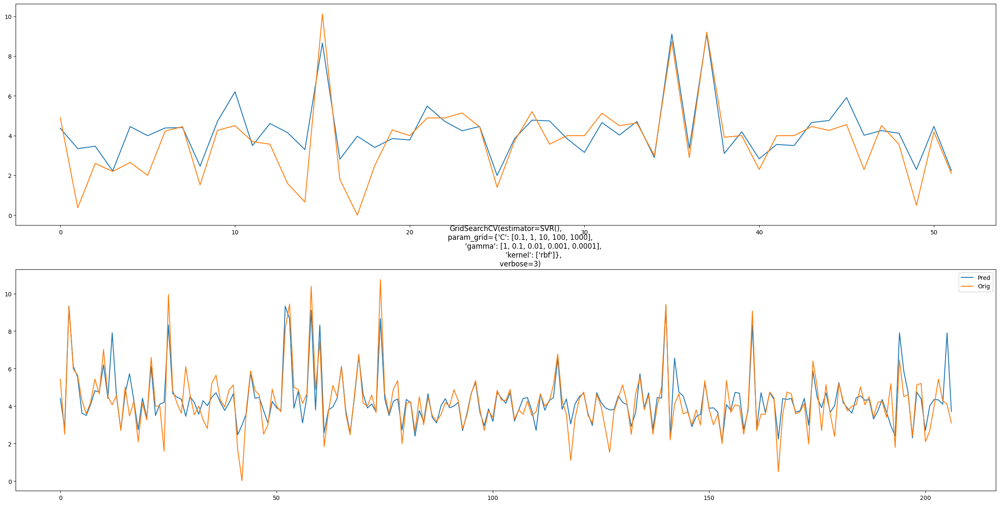

In [142]:
param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']}
grid = GridSearchCV(SVR(), param_grid, refit = True, verbose = 3)
pipeline(grid, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV 1/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.069 total time=   0.0s
[CV 2/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.022 total time=   0.0s
[CV 3/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.062 total time=   0.0s
[CV 4/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.120 total time=   0.0s
[CV 5/5] END ........C=0.1, gamma=1, kernel=rbf;, score=0.074 total time=   0.0s
[CV 1/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.003 total time=   0.0s
[CV 2/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.060 total time=   0.0s
[CV 3/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.003 total time=   0.0s
[CV 4/5] END ......C=0.1, gamma=0.1, kernel=rbf;, score=0.006 total time=   0.0s
[CV 5/5] END .....C=0.1, gamma=0.1, kernel=rbf;, score=-0.076 total time=   0.0s
[CV 1/5] END ....C=0.1, gamma=0.01, kernel=rbf;, score=-0.010 total time=   0.0s
[CV 2/5] END ....C=0.1, gamma=0.01, kernel=rbf;

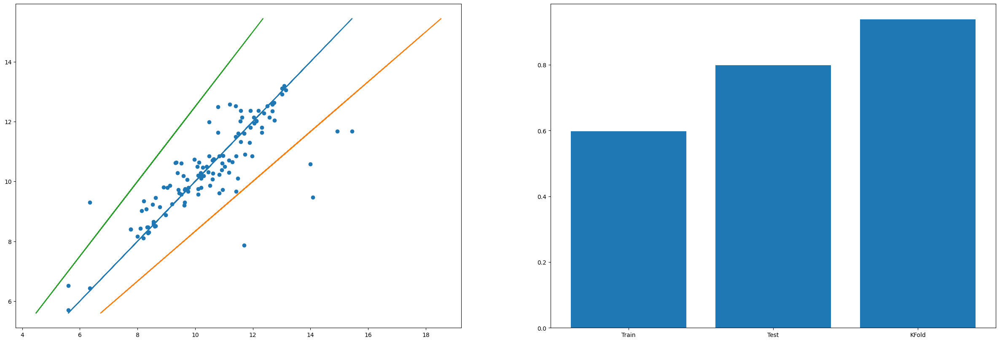

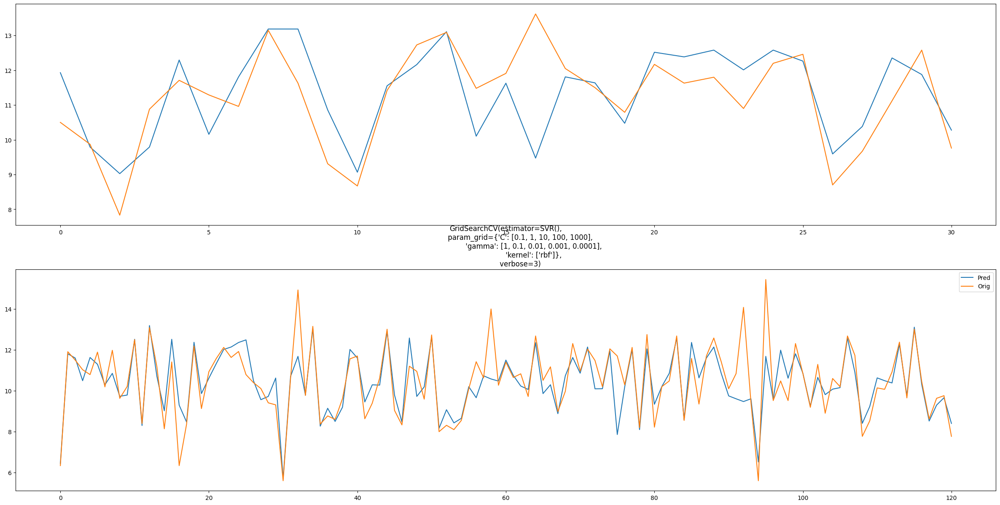

In [143]:
param_grid = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']}
grid = GridSearchCV(SVR(), param_grid, refit = True, verbose = 3)
pipeline(grid, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')

In [144]:
pickle.dump(model, open('fs.sav', 'wb'))

### XGBoost

[21:15:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

Train r2:  0.25361461708362365
Train MAE:  11.86119230566586
Train RMSE:  16.233856192139907
Test r2:  0.08427834272154977
Test MAE:  10.374015347649069
Test RMSE:  13.725289448530637
Scatter Index: 32.34786152374684
[21:15:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

[21:15:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

[21:15:21] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci

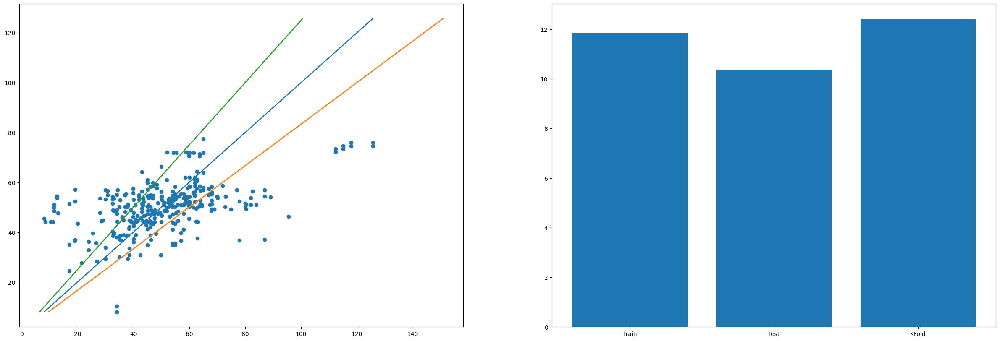

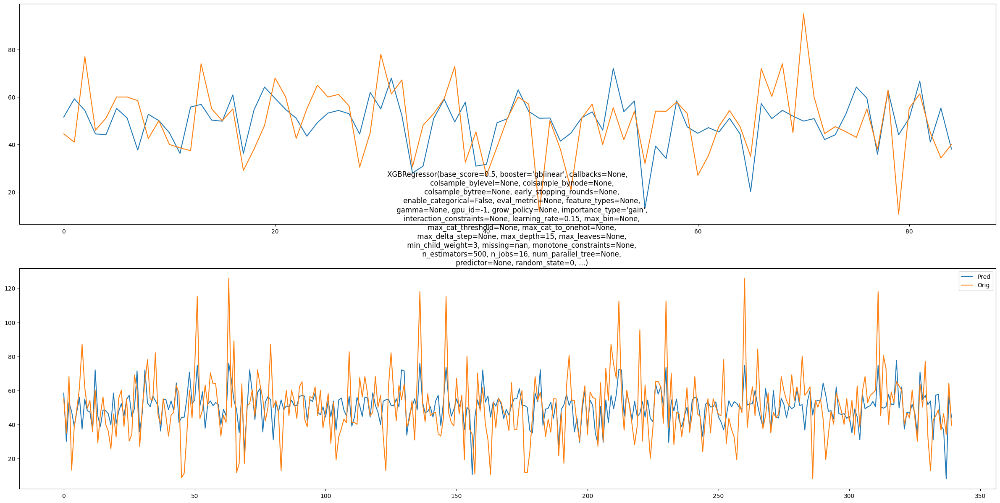

In [145]:
from xgboost import XGBRegressor
model = XGBRegressor(base_score=0.5, booster='gblinear', colsample_bylevel=None,
             colsample_bynode=None, colsample_bytree=None, gamma=None,
             gpu_id=-1, importance_type='gain', interaction_constraints=None,
             learning_rate=0.15, max_delta_step=None, max_depth=15,
             min_child_weight=3, monotone_constraints=None,
             n_estimators=500, n_jobs=16, num_parallel_tree=None,
             random_state=0, reg_alpha=0, reg_lambda=0, scale_pos_weight=1,
             subsample=None, tree_method=None, validate_parameters=1,
             verbosity=None)
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')

[21:15:25] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

Train r2:  0.6244332296203549
Train MAE:  0.7255304114945267
Train RMSE:  0.9558603213528069
Test r2:  0.6482148352948571
Test MAE:  0.8441724806565506
Test RMSE:  1.1451768641321207
Scatter Index: 22.51301094657562
[21:15:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

[21:15:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

[21:15:26] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-

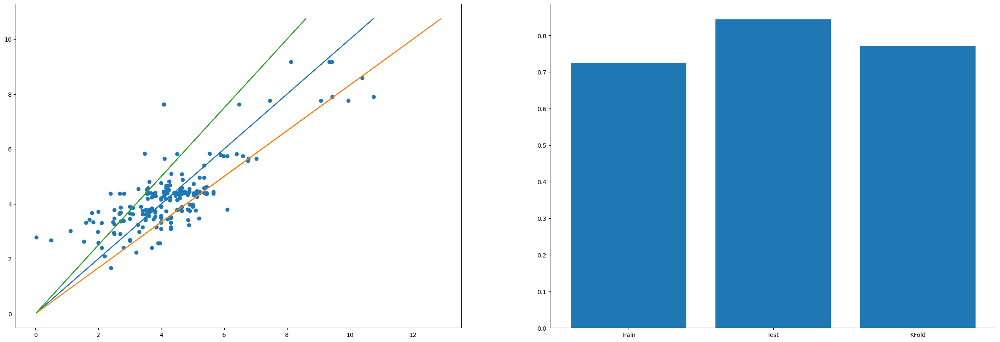

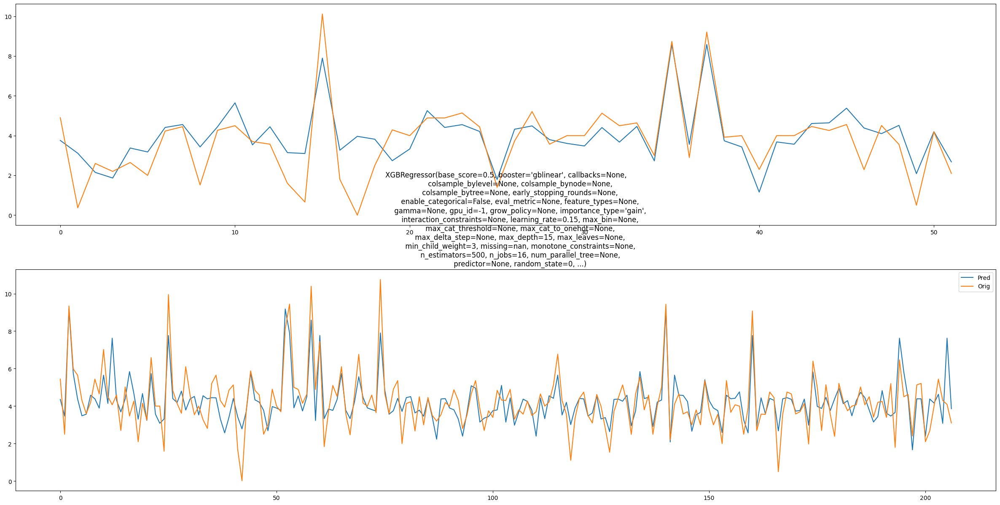

In [146]:
model = XGBRegressor(base_score=0.5, booster='gblinear', colsample_bylevel=None,
             colsample_bynode=None, colsample_bytree=None, gamma=None,
             gpu_id=-1, importance_type='gain', interaction_constraints=None,
             learning_rate=0.15, max_delta_step=None, max_depth=15,
             min_child_weight=3, monotone_constraints=None,
             n_estimators=500, n_jobs=16, num_parallel_tree=None,
             random_state=0, reg_alpha=0, reg_lambda=0, scale_pos_weight=1,
             subsample=None, tree_method=None, validate_parameters=1,
             verbosity=None)
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')

[21:15:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

Train r2:  0.3499775475566169
Train MAE:  1.1082577710112265
Train RMSE:  1.4255143463031892
Test r2:  0.13131374399429374
Test MAE:  0.9837137382261216
Test RMSE:  1.276216839028635
Scatter Index: 13.63648094225609
[21:15:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

[21:15:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "max_depth", "min_child_weight" } are not used.

[21:15:30] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-07593ffd91cd9da33-1\xgboost\xgboost-ci-

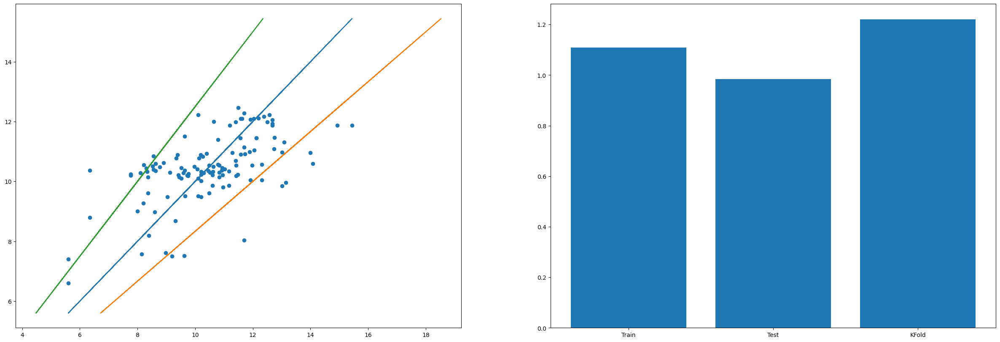

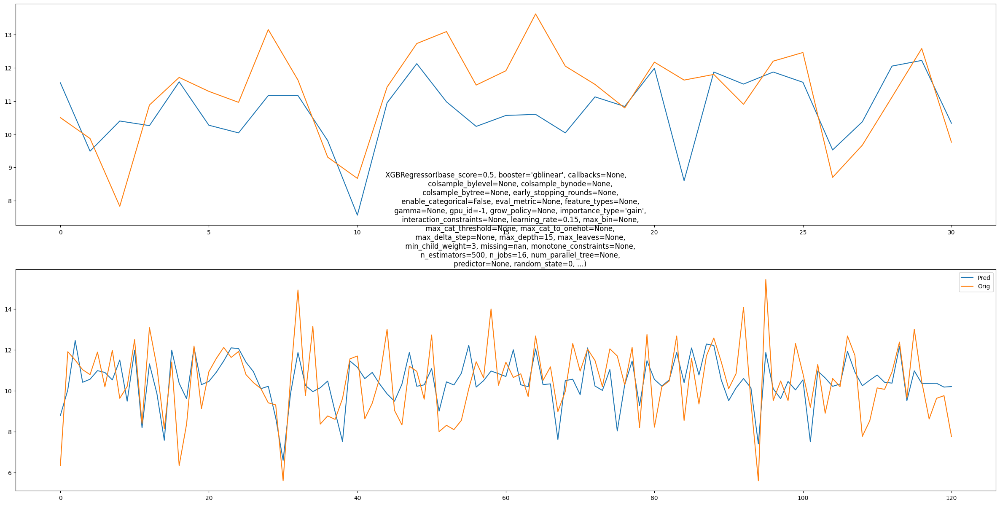

In [147]:
model = XGBRegressor(base_score=0.5, booster='gblinear', colsample_bylevel=None,
             colsample_bynode=None, colsample_bytree=None, gamma=None,
             gpu_id=-1, importance_type='gain', interaction_constraints=None,
             learning_rate=0.15, max_delta_step=None, max_depth=15,
             min_child_weight=3, monotone_constraints=None,
             n_estimators=500, n_jobs=16, num_parallel_tree=None,
             random_state=0, reg_alpha=0, reg_lambda=0, scale_pos_weight=1,
             subsample=None, tree_method=None, validate_parameters=1,
             verbosity=None)
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')

### ANN

Train r2:  0.45118583798930867
Train MAE:  10.090044971381143
Train RMSE:  13.920434349122463
Test r2:  0.23191498586207904
Test MAE:  9.314986505844146
Test RMSE:  12.570264469616317
Scatter Index: 27.443686672867617
K Fold MAE: 11.733788346880749


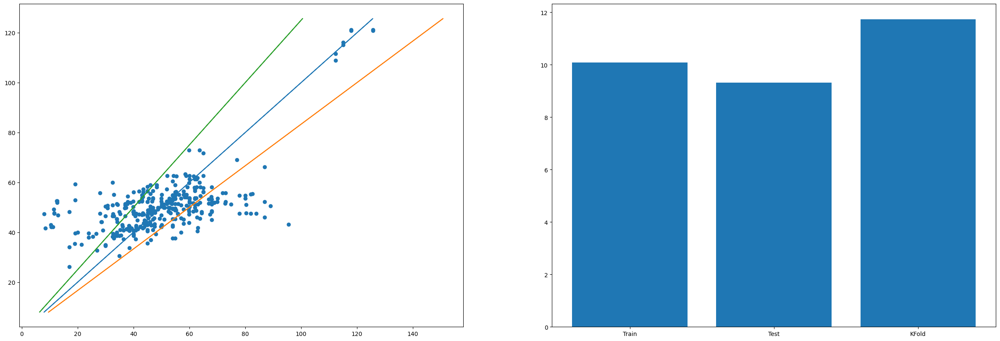

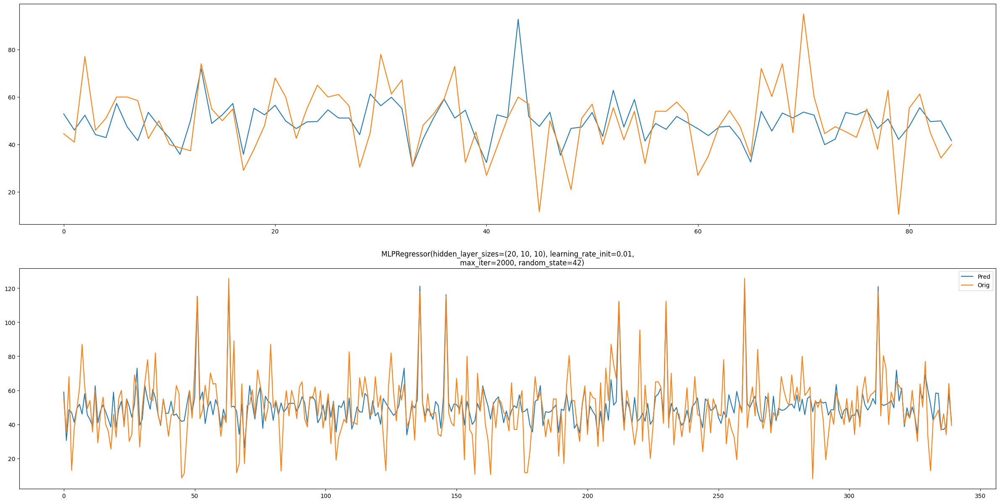

In [148]:
from sklearn.neural_network import MLPRegressor
model = MLPRegressor(hidden_layer_sizes = (20, 10, 10), random_state=42, max_iter=2000, momentum=0.9, learning_rate_init = 0.01)
pipeline(model, cs_x_train, cs_y_train, cs_x_test, cs_y_test, 'CS')

Train r2:  0.6150437959611774
Train MAE:  0.7167495191233209
Train RMSE:  0.96773515023983
Test r2:  0.6508143907656841
Test MAE:  0.8294054888716716
Test RMSE:  1.1409378126842593
Scatter Index: 22.821454532581935
K Fold MAE: 0.760672609905669


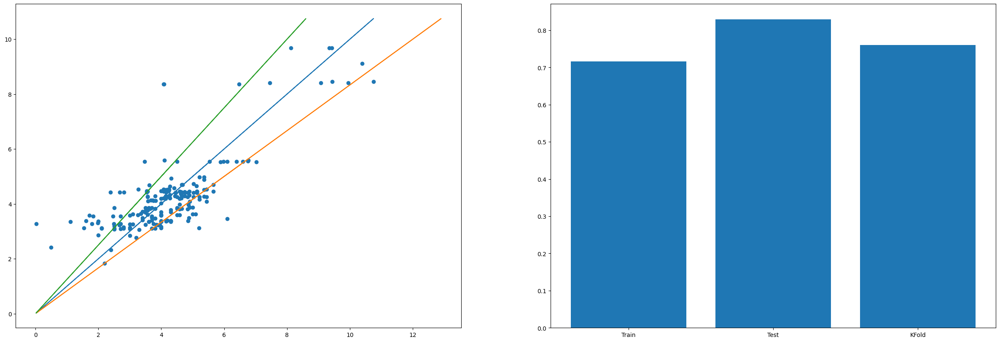

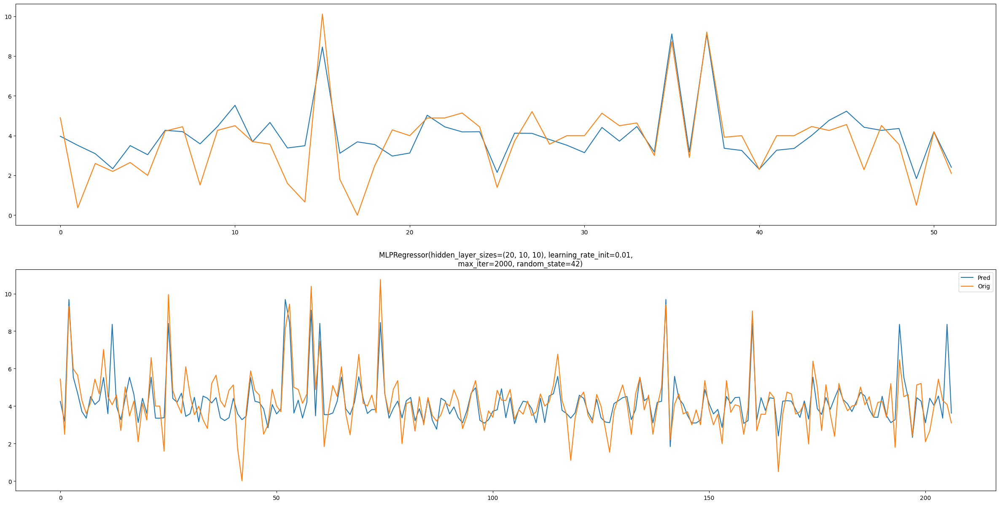

In [149]:
model = MLPRegressor(hidden_layer_sizes = (20, 10, 10), random_state=42, max_iter=2000, momentum=0.9, learning_rate_init = 0.01)
pipeline(model, ts_x_train, ts_y_train, ts_x_test, ts_y_test, 'TS')

Train r2:  0.7424400005204884
Train MAE:  0.664815805209753
Train RMSE:  0.8973184990313331
Test r2:  0.09290247320916956
Test MAE:  1.0664419471332531
Test RMSE:  1.304127301622698
Scatter Index: 8.537791696443826
K Fold MAE: 0.8907431789545784


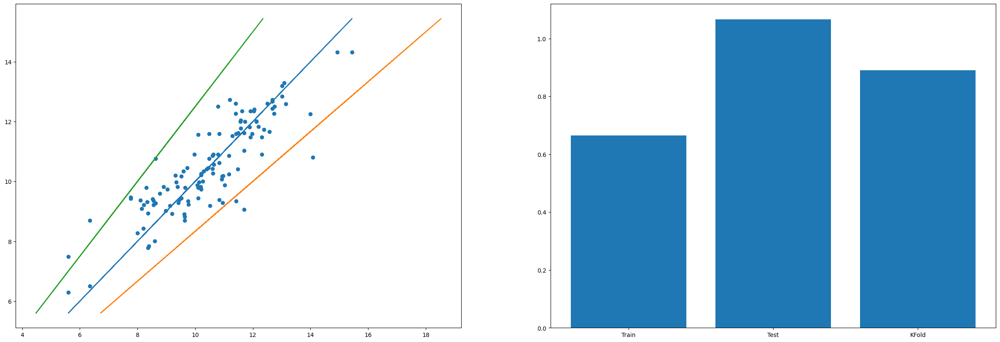

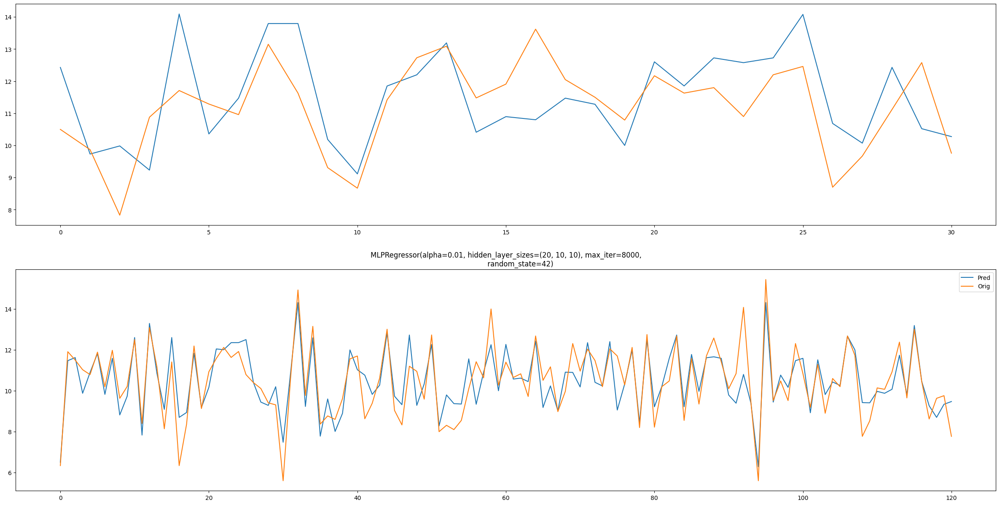

In [150]:
model = MLPRegressor(hidden_layer_sizes = (20, 10, 10), alpha=0.01, random_state=42, max_iter=8000)
pipeline(model, fs_x_train, fs_y_train, fs_x_test, fs_y_test, 'FS')

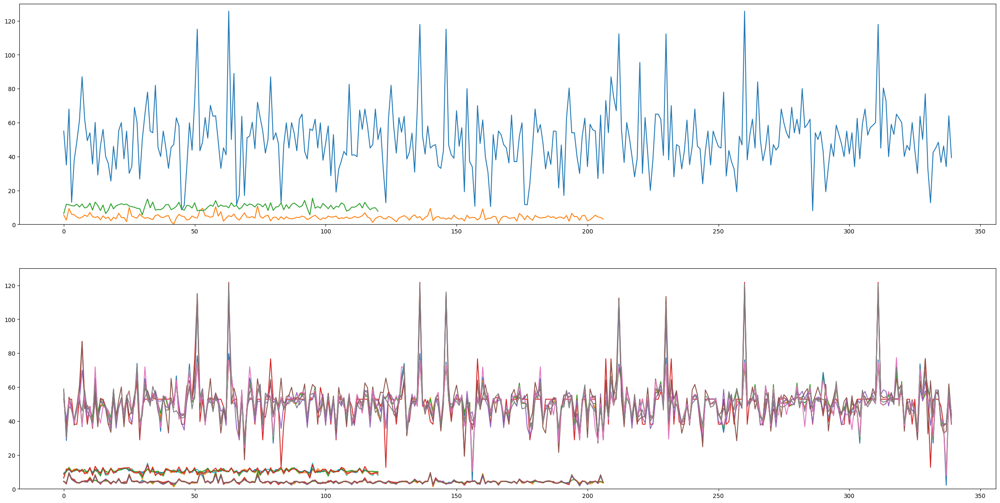

In [151]:
fig, ax = plt.subplots(2, 1)
fig.set_figheight(15)
fig.set_figwidth(30)
ax[0].set_ylim((0, 130))
ax[1].set_ylim((0, 130))
ax[0].plot(range(len(cs_y_train)), cs_y_train, label='CS')
ax[0].plot(range(len(ts_y_train)), ts_y_train, label='TS')
ax[0].plot(range(len(fs_y_train)), fs_y_train, label='FS')
for k1 in final_preds.keys():
    for k2 in range(len(final_preds[k1])):
        for k in final_preds[k1][k2].keys():
            ax[1].plot(range(len(final_preds[k1][k2][k])), final_preds[k1][k2][k])

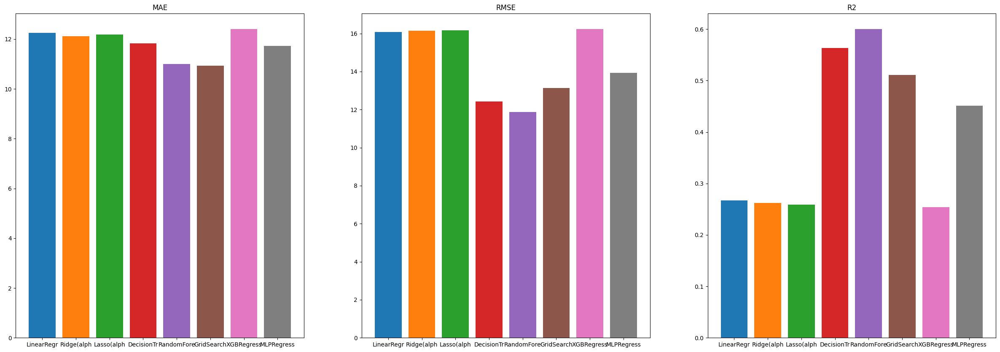

In [152]:
cs_mae, cs_rmse, cs_r2 = final_mae['CS'], final_rmse['CS'], final_r2['CS']
fig, ax = plt.subplots(1,3)
fig.set_figheight(10)
fig.set_figwidth(30)
ax[0].set_title('MAE')
for k in range(len(cs_mae)):
    for k1 in cs_mae[k].keys():
        ax[0].bar(k1[:10], cs_mae[k][k1])
ax[1].set_title('RMSE')
for k in range(len(cs_rmse)):
    for k1 in cs_rmse[k].keys():
        ax[1].bar(k1[:10], cs_rmse[k][k1])
ax[2].set_title('R2')
for k in range(len(cs_r2)):
    for k1 in cs_r2[k].keys():
        ax[2].bar(k1[:10], cs_r2[k][k1])

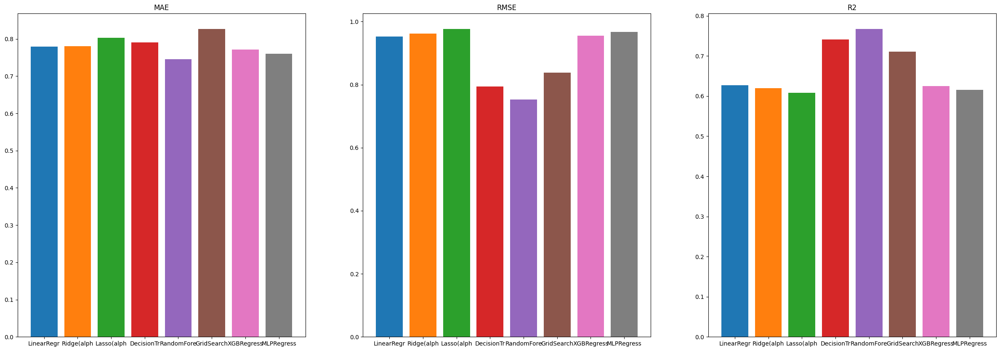

In [153]:
ts_mae, ts_rmse, ts_r2 = final_mae['TS'], final_rmse['TS'], final_r2['TS']
fig, ax = plt.subplots(1,3)
fig.set_figheight(10)
fig.set_figwidth(30)
ax[0].set_title('MAE')
for k in range(len(ts_mae)):
    for k1 in ts_mae[k].keys():
        ax[0].bar(k1[:10], ts_mae[k][k1])
ax[1].set_title('RMSE')
for k in range(len(ts_rmse)):
    for k1 in ts_rmse[k].keys():
        ax[1].bar(k1[:10], ts_rmse[k][k1])
ax[2].set_title('R2')
for k in range(len(ts_r2)):
    for k1 in ts_r2[k].keys():
        ax[2].bar(k1[:10], ts_r2[k][k1])

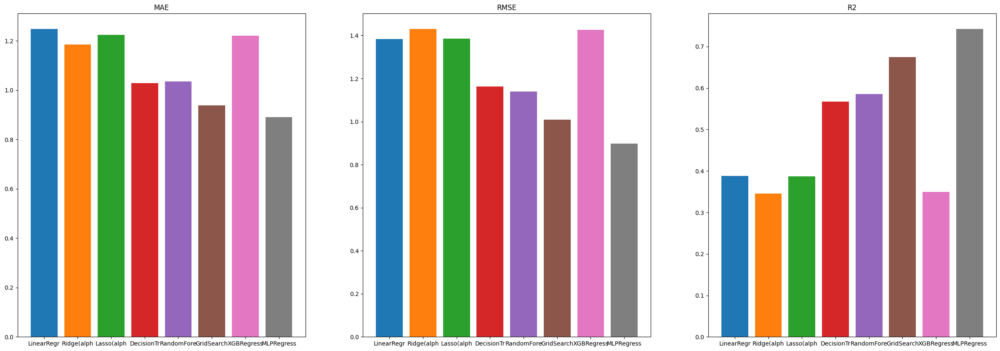

In [154]:
fs_mae, fs_rmse, fs_r2 = final_mae['FS'], final_rmse['FS'], final_r2['FS']
fig, ax = plt.subplots(1,3)
fig.set_figheight(10)
fig.set_figwidth(30)
ax[0].set_title('MAE')
for k in range(len(fs_mae)):
    for k1 in fs_mae[k].keys():
        ax[0].bar(k1[:10], fs_mae[k][k1])
ax[1].set_title('RMSE')
for k in range(len(fs_rmse)):
    for k1 in fs_rmse[k].keys():
        ax[1].bar(k1[:10], fs_rmse[k][k1])
ax[2].set_title('R2')
for k in range(len(fs_r2)):
    for k1 in fs_r2[k].keys():
        ax[2].bar(k1[:10], fs_r2[k][k1])

In [155]:
df_cs = pd.DataFrame()
for k1 in range(len(final_preds['CS'])):
        df = pd.DataFrame.from_dict(final_preds['CS'][k1])
        df_cs = pd.concat([df_cs, df], axis=1)
df_cs = pd.concat([df_cs, train_cs], axis=1)

df_ts = pd.DataFrame()
for k1 in range(len(final_preds['TS'])):
        df = pd.DataFrame.from_dict(final_preds['TS'][k1])
        df_ts = pd.concat([df_ts, df], axis=1)
df_ts = pd.concat([df_ts, train_ts], axis=1)

df_fs = pd.DataFrame()
for k1 in range(len(final_preds['FS'])):
        df = pd.DataFrame.from_dict(final_preds['FS'][k1])
        df_fs = pd.concat([df_fs, df], axis=1)
df_fs = pd.concat([df_fs, train_fs], axis=1)
df_fs.columns        

Index(['LinearRegression()', 'Ridge(alpha=0.5)', 'Lasso(alpha=0.001)',
       'DecisionTreeRegressor(max_depth=5)',
       'RandomForestRegressor(max_depth=3)',
       'GridSearchCV(estimator=SVR(),\n             param_grid={'C': [0.1, 1, 10, 100, 1000],\n                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],\n                         'kernel': ['rbf']},\n             verbose=3)',
       'XGBRegressor(base_score=0.5, booster='gblinear', callbacks=None,\n             colsample_bylevel=None, colsample_bynode=None,\n             colsample_bytree=None, early_stopping_rounds=None,\n             enable_categorical=False, eval_metric=None, feature_types=None,\n             gamma=None, gpu_id=-1, grow_policy=None, importance_type='gain',\n             interaction_constraints=None, learning_rate=0.15, max_bin=None,\n             max_cat_threshold=None, max_cat_to_onehot=None,\n             max_delta_step=None, max_depth=15, max_leaves=None,\n             min_child_weight=3, missing=na

In [156]:
df_cs.head()

,LinearRegression(),Ridge(alpha=0.5),Lasso(alpha=0.05),DecisionTreeRegressor(max_depth=5),RandomForestRegressor(max_depth=5),"GridSearchCV(estimator=SVR(),\n param_grid={'C': [0.1, 1, 10, 100, 1000],\n 'gamma': [1, 0.1, 0.01, 0.001, 0.0001],\n 'kernel': ['rbf']},\n verbose=3)","XGBRegressor(base_score=0.5, booster='gblinear', callbacks=None,\n colsample_bylevel=None, colsample_bynode=None,\n colsample_bytree=None, early_stopping_rounds=None,\n enable_categorical=False, eval_metric=None, feature_types=None,\n gamma=None, gpu_id=-1, grow_policy=None, importance_type='gain',\n interaction_constraints=None, learning_rate=0.15, max_bin=None,\n max_cat_threshold=None, max_cat_to_onehot=None,\n max_delta_step=None, max_depth=15, max_leaves=None,\n min_child_weight=3, missing=nan, monotone_constraints=None,\n n_estimators=500, n_jobs=16, num_parallel_tree=None,\n predictor=None, random_state=0, ...)","MLPRegressor(hidden_layer_sizes=(20, 10, 10), learning_rate_init=0.01,\n max_iter=2000, random_state=42)",Actual
0,58.282688,57.557075,57.485990,52.867265,53.086910,56.000099,58.323067,58.956904,55.0
1,28.507441,31.829846,30.893780,38.095000,40.476873,35.099513,29.955996,30.538902,35.0
2,52.484304,52.239445,51.915898,52.867265,52.116263,54.108847,52.627113,48.542899,68.0
3,48.034195,47.954830,47.922752,52.867265,46.370817,48.746019,47.579224,46.962077,13.0
4,39.028378,39.473794,39.960321,38.066481,39.246972,37.536046,38.771530,41.199545,38.0


In [157]:
df_cs.to_excel('Results_CS.xlsx', index=False)
df_ts.to_excel('Results_TS.xlsx', index=False)
df_fs.to_excel('Results_FS.xlsx', index=False)